In [167]:
import pandas as pd
import numpy as np
import matplotlib as matplot
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.set_option('display.max_columns', None)

In [168]:
## Global output settings

plt.rcParams['figure.dpi'] = 300  # Change to your desired DPI
sns.set(context="talk", font_scale=1)
sns.set_style("white")

In [169]:
# Import attendance data from District Dashboard
attendance_df=pd.read_excel('Resources/student_attendance_042825.xlsx')
attendance_df.head()

C:\Users\mcyang\AppData\Local\miniconda3\envs\dev\Lib\site-packages\openpyxl\styles\stylesheet.py:226: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


,Site,Program,Student,District287 Id,Grade,Reported Race,% Present,% Attendance not Taken (Presumed Present),Earliest Date,Latest Date
0,CTC,0032,"George-Ejike, Aaron E.",3649115.0,12,Black or African American,0.000000,0.0,2025-01-28,2025-02-21
1,CTC,0032,"Garcia Galaviz, Daisy C.",3678877.0,11,Hispanic,0.000000,0.0,2025-01-28,2025-02-24
2,CTC,0801,"Martinez-Vidal, Kiara N.",117941.0,14,Hispanic,0.022436,0.0,2024-10-29,2024-11-15
3,NEC,0772,"Shin, Richie A.",3659052.0,14,Asian,0.024306,0.0,2024-09-13,2024-10-07
4,SEC,0622,"Pryor, Alexandria R.",3681222.0,12,Hispanic,0.027778,0.0,2024-11-11,2025-04-21


In [170]:
attendance_df.tail()

,Site,Program,Student,District287 Id,Grade,Reported Race,% Present,% Attendance not Taken (Presumed Present),Earliest Date,Latest Date
3039,WEC,0800,"Schrader, Jackson J.",89981.0,14,White,1.000000,NaN,2024-09-03,2024-09-23
3040,WEC,303W,"Awoke, Ruth A.",125423.0,12,Black or African American,1.000000,0.250000,2025-04-21,2025-04-25
3041,Total,NaN,NaN,NaN,NaN,NaN,0.723705,0.077637,2024-06-17,2025-04-25
3042,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT
3043,Applied filters:\nSchool Year is 2024-2025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT


In [171]:
# Drop unneccessary rows
attendance_df=attendance_df.drop(3041)

In [172]:
attendance_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3043 entries, 0 to 3043
Data columns (total 10 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Site                                       3042 non-null   object        
 1   Program                                    3041 non-null   object        
 2   Student                                    3041 non-null   object        
 3   District287 Id                             3041 non-null   float64       
 4   Grade                                      3041 non-null   object        
 5   Reported Race                              3041 non-null   object        
 6   % Present                                  3032 non-null   float64       
 7   % Attendance not Taken (Presumed Present)  3016 non-null   float64       
 8   Earliest Date                              3041 non-null   datetime64[ns]
 9   Latest Date             

In [173]:
# Rename columns
attendance_df=attendance_df.rename(columns={'% Present':'Attendance Rate', 'Reported Race':'Student Race', 'Student':'Student Name'})
attendance_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3043 entries, 0 to 3043
Data columns (total 10 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Site                                       3042 non-null   object        
 1   Program                                    3041 non-null   object        
 2   Student Name                               3041 non-null   object        
 3   District287 Id                             3041 non-null   float64       
 4   Grade                                      3041 non-null   object        
 5   Student Race                               3041 non-null   object        
 6   Attendance Rate                            3032 non-null   float64       
 7   % Attendance not Taken (Presumed Present)  3016 non-null   float64       
 8   Earliest Date                              3041 non-null   datetime64[ns]
 9   Latest Date             

In [174]:
# Drop students with no attendance data
attendance_df=attendance_df.dropna(subset='Attendance Rate')

In [175]:
# Get site counts
attendance_df['Site'].value_counts()

Site
C&T     1525
CTC      557
NEC      302
SEC      272
WEC      229
ABEC     147
Name: count, dtype: int64

In [176]:
# Drop sites from analysis
sites_to_drop=['C&T']
attendance_df=attendance_df[~attendance_df['Site'].isin(sites_to_drop)]
attendance_df.groupby('Site')['Program'].value_counts()

Site  Program
ABEC  302A        47
      303A        35
      303AT       33
      302AT       32
CTC   0032       411
      0801       117
      301CT       29
NEC   302N       128
      303N       108
      0772        66
SEC   302S        95
      0622        84
      303S        56
      303ST       37
WEC   0800       142
      302W        33
      303W        29
      302WT       20
      303WT        5
Name: count, dtype: int64

In [177]:
# Classify by school
nec=['302N', '303N']
neca=['0772']
sec=['302S', '303S', '303ST']
seca=['0622']
wec=['302W', '303W', '303WT', '302WT']
walt=['0800']

attendance_df.loc[attendance_df['Program'].isin(nec), 'School']='NEC SPED'
attendance_df.loc[attendance_df['Program'].isin(neca), 'School']='NECA'
attendance_df.loc[attendance_df['Program'].isin(sec), 'School']='SEC SPED'
attendance_df.loc[attendance_df['Program'].isin(seca), 'School']='SECA'
attendance_df.loc[attendance_df['Program'].isin(wec), 'School']='WEC SPED'
attendance_df.loc[attendance_df['Program'].isin(walt), 'School']='W-ALT'
attendance_df.loc[attendance_df['Program']=='0801', 'School']='Gateway'
attendance_df.loc[attendance_df['Program']=='0032', 'School']='Pathways'
attendance_df.loc[attendance_df['Program']=='301CT', 'School']='CTC Transition'
attendance_df.loc[attendance_df['Site']=='ABEC', 'School']='ABEC'
attendance_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1507 entries, 0 to 3040
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Site                                       1507 non-null   object        
 1   Program                                    1507 non-null   object        
 2   Student Name                               1507 non-null   object        
 3   District287 Id                             1507 non-null   float64       
 4   Grade                                      1507 non-null   object        
 5   Student Race                               1507 non-null   object        
 6   Attendance Rate                            1507 non-null   float64       
 7   % Attendance not Taken (Presumed Present)  1491 non-null   float64       
 8   Earliest Date                              1507 non-null   datetime64[ns]
 9   Latest Date             

In [178]:
# For students who transferred schools, keep data for each school.
# Check for students who transferred programs within a school. Only keep data for most recent program within a school.
attendance_df[attendance_df.duplicated(subset=['School', 'District287 Id'], keep=False)].sort_values('District287 Id').head()

,Site,Program,Student Name,District287 Id,Grade,Student Race,Attendance Rate,% Attendance not Taken (Presumed Present),Earliest Date,Latest Date,School
1464,NEC,302N,"Dempsey, AJ M.",101529.0,07,Black or African American,0.948506,0.159591,2024-09-03,2025-02-25,NEC SPED
1611,NEC,303N,"Dempsey, AJ M.",101529.0,07,Black or African American,0.972222,0.114583,2025-02-26,2025-04-25,NEC SPED
323,WEC,302W,"Nankissore, Amid",113246.0,12,Native Hawaiian or Other Pacific Islander,0.393145,0.050403,2024-09-04,2024-12-09,WEC SPED
1149,WEC,303W,"Nankissore, Amid",113246.0,12,Native Hawaiian or Other Pacific Islander,0.878049,0.109756,2025-02-19,2025-04-25,WEC SPED
793,WEC,302W,"Benford, Tae T.",118896.0,11,Black or African American,0.766827,0.131010,2024-09-03,2025-02-21,WEC SPED


In [179]:
# Skip if no program transfer students found in previous step

# Sort each school by student and "Earliest" column, the earliest date that the student has behavior data for each program
attendance_df=attendance_df.sort_values(['School', 'District287 Id', 'Earliest Date'], ascending=False)

# Drop duplicate students at each school and only keep first entry (most recent program that student has behavior data for)
attendance_df=attendance_df.drop_duplicates(subset=['School', 'District287 Id'], keep='first')
attendance_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1490 entries, 332 to 1478
Data columns (total 11 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Site                                       1490 non-null   object        
 1   Program                                    1490 non-null   object        
 2   Student Name                               1490 non-null   object        
 3   District287 Id                             1490 non-null   float64       
 4   Grade                                      1490 non-null   object        
 5   Student Race                               1490 non-null   object        
 6   Attendance Rate                            1490 non-null   float64       
 7   % Attendance not Taken (Presumed Present)  1474 non-null   float64       
 8   Earliest Date                              1490 non-null   datetime64[ns]
 9   Latest Date           

In [180]:
# Check if duplicates sucessfully dropped
attendance_df[attendance_df[['School', 'District287 Id']].duplicated(keep=False)]

,Site,Program,Student Name,District287 Id,Grade,Student Race,Attendance Rate,% Attendance not Taken (Presumed Present),Earliest Date,Latest Date,School


In [181]:
# Drop unneccessary columns
attendance_df=attendance_df.drop(columns=['Earliest Date', 'Latest Date'])
attendance_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1490 entries, 332 to 1478
Data columns (total 9 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Site                                       1490 non-null   object 
 1   Program                                    1490 non-null   object 
 2   Student Name                               1490 non-null   object 
 3   District287 Id                             1490 non-null   float64
 4   Grade                                      1490 non-null   object 
 5   Student Race                               1490 non-null   object 
 6   Attendance Rate                            1490 non-null   float64
 7   % Attendance not Taken (Presumed Present)  1474 non-null   float64
 8   School                                     1490 non-null   object 
dtypes: float64(3), object(6)
memory usage: 116.4+ KB


## Merge student body data

In [182]:
# Read cleaned student data from Synergy
student_df=pd.read_csv('Resources/student_data_cleaned_042825.csv')
student_df.head()

,Site/Program,Student Name,District287 Id,Grade,Student Gender,Student Age,Language Spoken In the Home,Original Enter Date,District Of Residence,Student Race,State Ethnicity,Years Enrolled,Student Age_Years,School
0,303N NEC Tier 3,"Abas, Yusra",3676664,04,Female,10 yrs 0 mths,Somali (069),2023-12-21,0279 Osseo,Black or African American,0-0 Non North American Indian,0.96,10,NEC SPED
1,301CT CTC Tier 1 Trn,"(Abdelhadi, Noor R.)",101415,15,Female,20 yrs 5 mths,English (011),2019-12-16,0272 Eden Prairie,White,0-0 Non North American Indian,4.97,20,CTC Transition
2,302S SEC Tier 2,"Abdi, Abdinasir M.",3678969,02,Male,7 yrs 11 mths,Somali (069),2024-09-03,0270 Hopkins,Black or African American,0-0 Non North American Indian,0.25,7,SEC SPED
3,Gateway Academy 801,"(Abdi, Abdirahman Y.)",3676488,12,Male,18 yrs 6 mths,English (011),2023-08-01,0284 Wayzata,Black or African American,0-0 Non North American Indian,1.35,18,Gateway Academy
4,SECA 622,"(Abdi, Asha I.)",3664395,14,Female,20 yrs 6 mths,Somali (069),2022-09-01,0270 Hopkins,Black or African American,0-0 Non North American Indian,2.26,20,SECA


In [183]:
student_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1389 entries, 0 to 1388
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Site/Program                 1389 non-null   object 
 1   Student Name                 1389 non-null   object 
 2   District287 Id               1389 non-null   int64  
 3   Grade                        1389 non-null   object 
 4   Student Gender               1389 non-null   object 
 5   Student Age                  1389 non-null   object 
 6   Language Spoken In the Home  1389 non-null   object 
 7   Original Enter Date          1383 non-null   object 
 8   District Of Residence        1389 non-null   object 
 9   Student Race                 1389 non-null   object 
 10  State Ethnicity              1389 non-null   object 
 11  Years Enrolled               1383 non-null   float64
 12  Student Age_Years            1389 non-null   int64  
 13  School            

In [184]:
# Drop redundant columns
student_df=student_df.drop(columns=['Site/Program', 'Student Name', 'Grade', 'Student Race', 'School'])
student_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1389 entries, 0 to 1388
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   District287 Id               1389 non-null   int64  
 1   Student Gender               1389 non-null   object 
 2   Student Age                  1389 non-null   object 
 3   Language Spoken In the Home  1389 non-null   object 
 4   Original Enter Date          1383 non-null   object 
 5   District Of Residence        1389 non-null   object 
 6   State Ethnicity              1389 non-null   object 
 7   Years Enrolled               1383 non-null   float64
 8   Student Age_Years            1389 non-null   int64  
dtypes: float64(1), int64(2), object(6)
memory usage: 97.8+ KB


In [185]:
# Merge dataframes
df=pd.merge(attendance_df, student_df, how='left', on='District287 Id')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1490 entries, 0 to 1489
Data columns (total 17 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Site                                       1490 non-null   object 
 1   Program                                    1490 non-null   object 
 2   Student Name                               1490 non-null   object 
 3   District287 Id                             1490 non-null   float64
 4   Grade                                      1490 non-null   object 
 5   Student Race                               1490 non-null   object 
 6   Attendance Rate                            1490 non-null   float64
 7   % Attendance not Taken (Presumed Present)  1474 non-null   float64
 8   School                                     1490 non-null   object 
 9   Student Gender                             1472 non-null   object 
 10  Student Age             

In [165]:
# Find students who are missing from student dataframe. These students most likely transferred out of the district. 
# Ignore if number of students is negligible, otherwise may have to repull more comprehensive data from Synergy.
missing_student_ids = list(set(attendance_df['District287 Id']) - set(student_df['District287 Id']))
len(missing_student_ids)

18

In [202]:
# Identify students who are chronically absent
df.loc[df['Attendance Rate']<.90, 'Chronic Absentee']=1
df.loc[df['Attendance Rate']>=.90, 'Chronic Absentee']=0
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1490 entries, 0 to 1489
Data columns (total 18 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Site                                       1490 non-null   object 
 1   Program                                    1490 non-null   object 
 2   Student Name                               1490 non-null   object 
 3   District287 Id                             1490 non-null   float64
 4   Grade                                      1490 non-null   object 
 5   Student Race                               1490 non-null   object 
 6   Attendance Rate                            1490 non-null   float64
 7   % Attendance not Taken (Presumed Present)  1474 non-null   float64
 8   School                                     1490 non-null   object 
 9   Student Gender                             1472 non-null   object 
 10  Student Age             

In [344]:
# Student race counts
df['Student Race'].value_counts()

Student Race
Black or African American                    555
White                                        493
Hispanic                                     196
Two or More                                  152
Asian                                         68
American Indian or Alaska Native              22
Native Hawaiian or Other Pacific Islander      4
Name: count, dtype: int64

In [345]:
# American Indian students count (state ethnicity)
df['State Ethnicity'].value_counts()

State Ethnicity
0-0 Non North American Indian    1401
1-1 North Am Indian/Alaskan        71
Name: count, dtype: int64

In [348]:
# When ISD 287 refers to American Indian students, State Ethnicity is used as indicator.
# Recode race for students whose State Ethnicity is American Indian. 
df.loc[df['State Ethnicity']=='1-1 North Am Indian/Alaskan', 'Student Race']='American Indian or Alaska Native'
df['Student Race'].value_counts()

Student Race
Black or African American                    555
White                                        493
Hispanic                                     184
Two or More                                  115
American Indian or Alaska Native              71
Asian                                         68
Native Hawaiian or Other Pacific Islander      4
Name: count, dtype: int64

## Attendance analysis

In [123]:
school_year='24-25'

In [124]:
# Calculate median attendance rates by school
attendance_rates=df.groupby('School')['Attendance Rate'].median().sort_values(ascending=False).to_frame()
attendance_rates

,Attendance Rate
School,
NEC SPED,0.920286
SEC SPED,0.903043
ABEC,0.862721
CTC Pathways,0.797887
CTC Transition,0.775080
WEC SPED,0.741979
W-ALT,0.478261
NECA,0.411409
Gateway Academy,0.304060


In [125]:
attendance_rates.to_clipboard()

C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2218629865.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


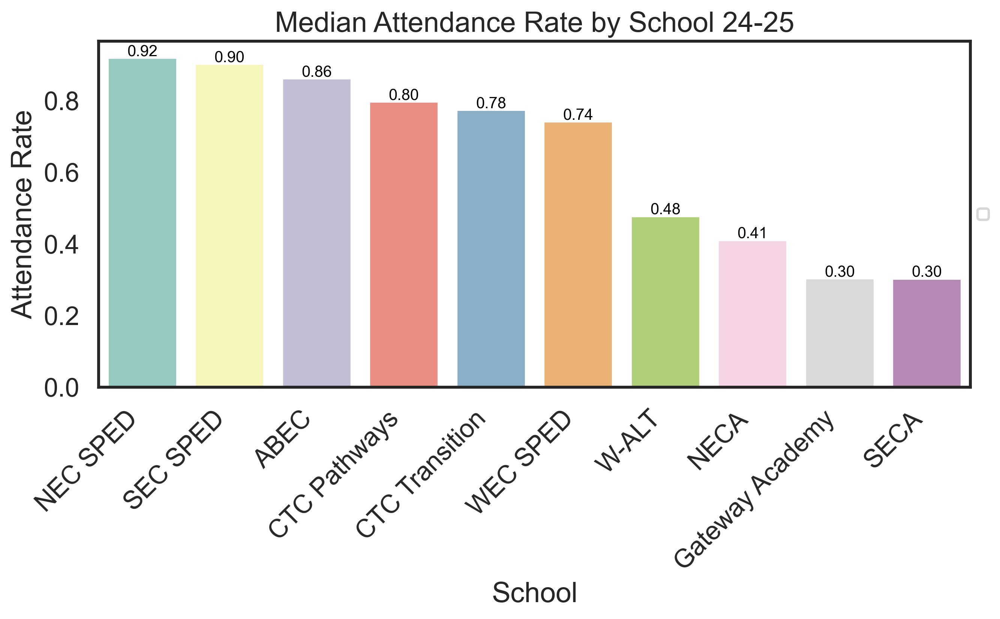

In [200]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(y='Attendance Rate',
            x='School',
              data=attendance_rates, 
              palette='Set3', 
              hue='School',
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    
plt.title(f'Median Attendance Rate by School {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/attendance_by_school', bbox_inches='tight')
plt.show()

In [127]:
# Calculate median attendance not taken
attendance_not_taken=df.groupby('School')['% Attendance not Taken (Presumed Present)'].median().round(4).sort_values(ascending=False).to_frame()
attendance_not_taken

,% Attendance not Taken (Presumed Present)
School,
WEC SPED,0.0681
NECA,0.0636
NEC SPED,0.0272
CTC Transition,0.0242
Gateway Academy,0.0109
W-ALT,0.0109
ABEC,0.0070
CTC Pathways,0.0070
SECA,0.0013


In [128]:
attendance_not_taken.to_clipboard()

C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1271796873.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


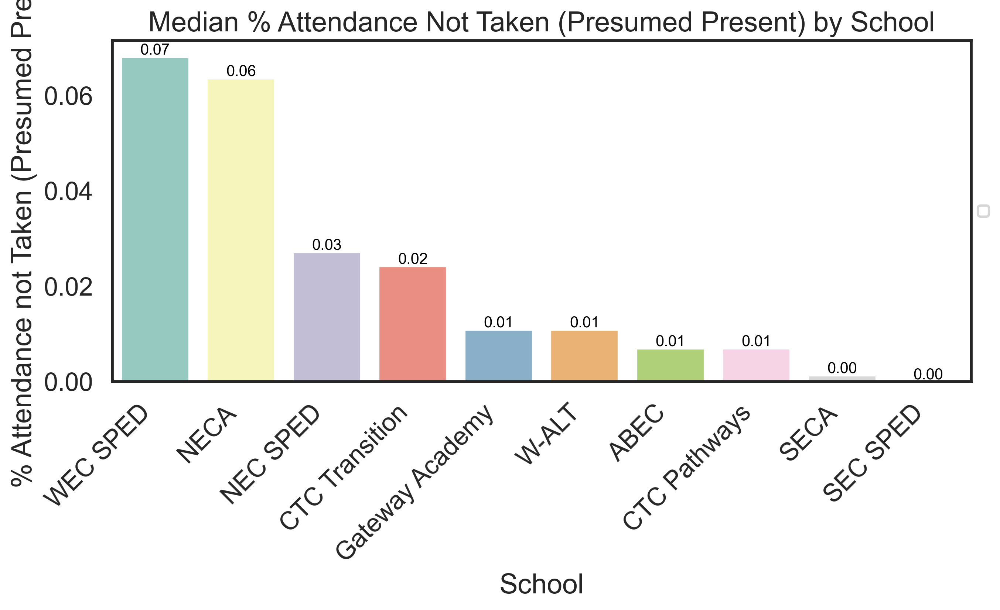

In [199]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(y='% Attendance not Taken (Presumed Present)',
            x='School',
              data=attendance_not_taken, 
              palette='Set3', 
              hue='School',
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .0005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    
plt.title(f'Median % Attendance Not Taken (Presumed Present) by School')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/attendance_not_taken_by_school', bbox_inches='tight')
plt.show()

In [130]:
# Calculate median attendance rates by school and gender
attendance_gender=df.groupby(['School', 'Student Gender'])['Attendance Rate'].median().to_frame()
attendance_gender

Attendance Rate
School          Student Gender                 
ABEC            Female                 0.825904
                Male                   0.876283
CTC Pathways    Female                 0.800000
                Male                   0.795775
CTC Transition  Female                 0.746113
                Male                   0.858438
Gateway Academy Female                 0.338028
                Male                   0.279070
NEC SPED        Female                 0.886360
                Male                   0.922297
NECA            Female                 0.449658
                Male                   0.346424
SEC SPED        Female                 0.876891
                Male                   0.903667
SECA            Female                 0.338542
                Male                   0.256872
W-ALT           Female                 0.460959
                Male                   0.508152
WEC SPED        Female                 0.762542
                Male                   0.741979

C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\3183109605.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


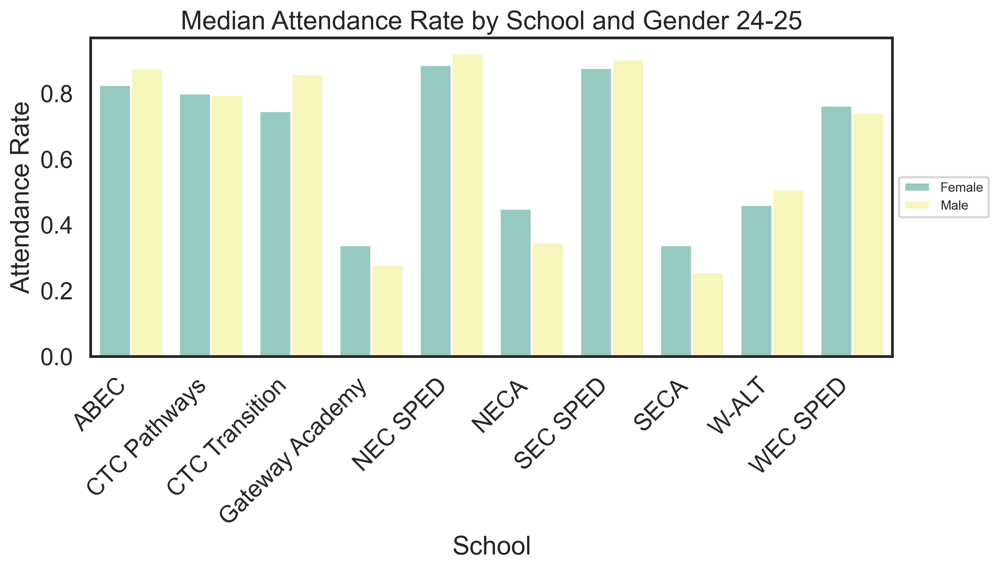

In [131]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(y='Attendance Rate',
            x='School',
              data=attendance_gender, 
              palette='Set3', 
              hue='Student Gender',
            errorbar=None
            )

# for p in ax.patches[0:12]:
#     height = p.get_height()
#     plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
#              ha='center', va='baseline', fontsize=10, color='black')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.title(f'Median Attendance Rate by School and Gender {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/attendance_by_gender', bbox_inches='tight')
plt.show()

In [133]:
# Proportion of students who are chronically absent by school
chronic_by_school=df.groupby('School')['Chronic Absentee'].value_counts(normalize=True).to_frame().reset_index()
chronic_by_school=chronic_by_school[chronic_by_school['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'}).sort_values('Proportion')
chronic_by_school

,School,Chronic Absentee,Proportion
9,NEC SPED,1.0,0.429787
13,SEC SPED,1.0,0.489583
0,ABEC,1.0,0.601266
4,CTC Transition,1.0,0.696429
18,WEC SPED,1.0,0.811765
16,W-ALT,1.0,0.862069
2,CTC Pathways,1.0,0.905488
10,NECA,1.0,0.925373
6,Gateway Academy,1.0,0.942623
14,SECA,1.0,0.975309


In [134]:
chronic_by_school.to_clipboard()

C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2241201366.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


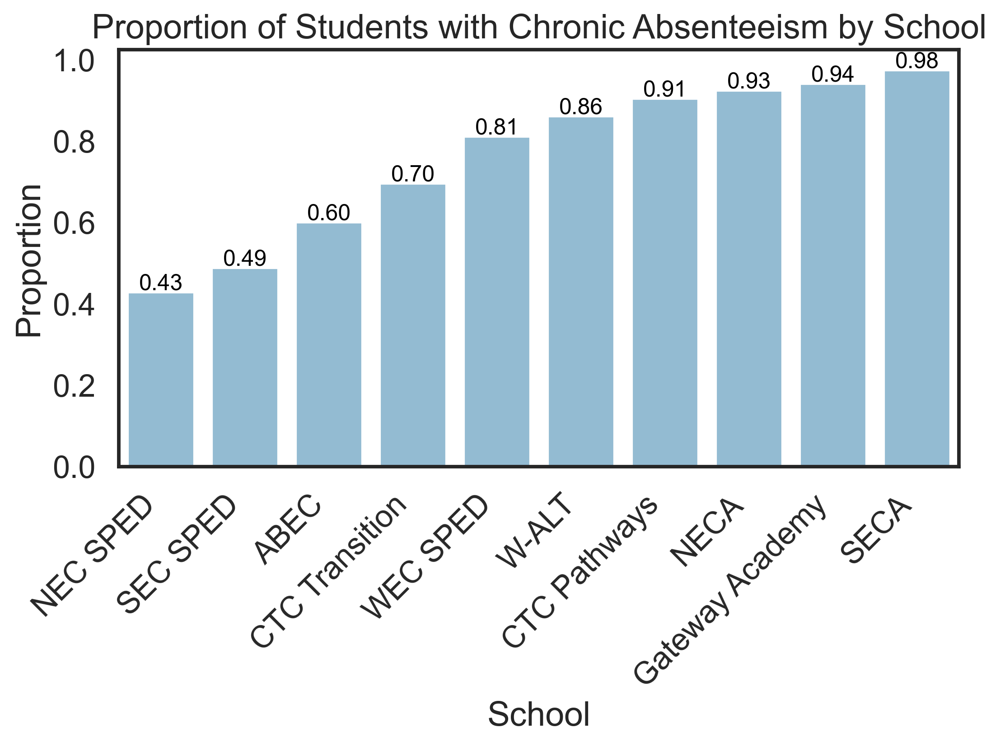

In [135]:
fig = plt.figure(figsize=(8,4))

df_to_plot=chronic_by_school

ax = sns.barplot(x='School', 
            y='Proportion',  
            data=df_to_plot, 
            color='#89bedc', 
            errorbar=None
            )

# Display proportion on top of bars
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=12, color='black')

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
plt.ylim(0, df_to_plot['Proportion'].max()+.05)

# Title of chart and file name
plt.title(f'Proportion of Students with Chronic Absenteeism by School')
plt.savefig('Outputs/chronic_by_school', bbox_inches='tight')

plt.show()

## NEC

In [203]:
nec_df=df[df['School']=='NEC SPED']

In [204]:
nec_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228 entries, 971 to 1198
Data columns (total 18 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Site                                       228 non-null    object 
 1   Program                                    228 non-null    object 
 2   Student Name                               228 non-null    object 
 3   District287 Id                             228 non-null    float64
 4   Grade                                      228 non-null    object 
 5   Student Race                               228 non-null    object 
 6   Attendance Rate                            228 non-null    float64
 7   % Attendance not Taken (Presumed Present)  228 non-null    float64
 8   School                                     228 non-null    object 
 9   Student Gender                             228 non-null    object 
 10  Student Age                 

In [188]:
nec_attendance_by_grade=nec_df.groupby('Grade')['Attendance Rate'].median().to_frame()
nec_attendance_by_grade

,Attendance Rate
Grade,
01,0.944762
02,0.894366
03,0.975277
04,0.915515
05,0.915395
06,0.914417
07,0.942244
08,0.856465
09,0.801690


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


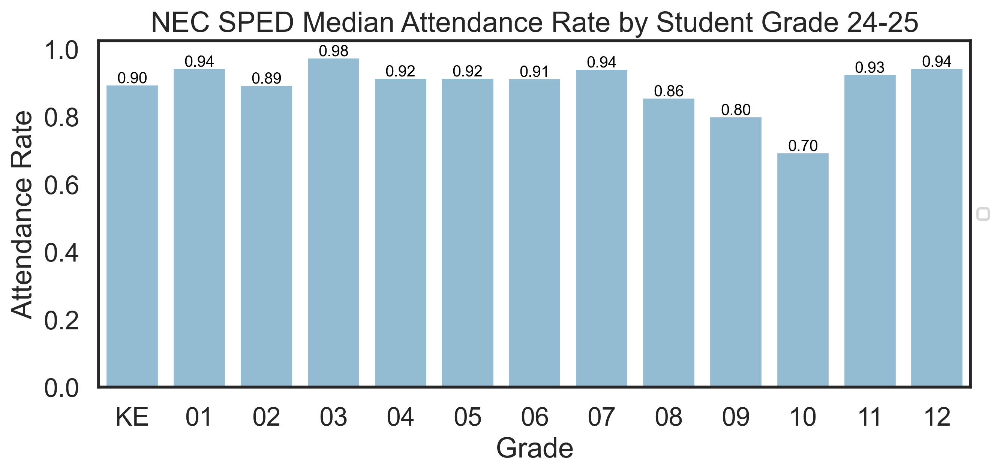

In [198]:
fig = plt.figure(figsize=(10,4))

order=['KE', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=nec_attendance_by_grade, 
              color='#89bedc', 
                 order=order,
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'NEC SPED Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/nec_attendance_by_grade', bbox_inches='tight')
plt.show()

In [190]:
nec_attendance_by_program=nec_df.groupby('Program')['Attendance Rate'].median().to_frame()
nec_attendance_by_program

,Attendance Rate
Program,
302N,0.911678
303N,0.937500


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


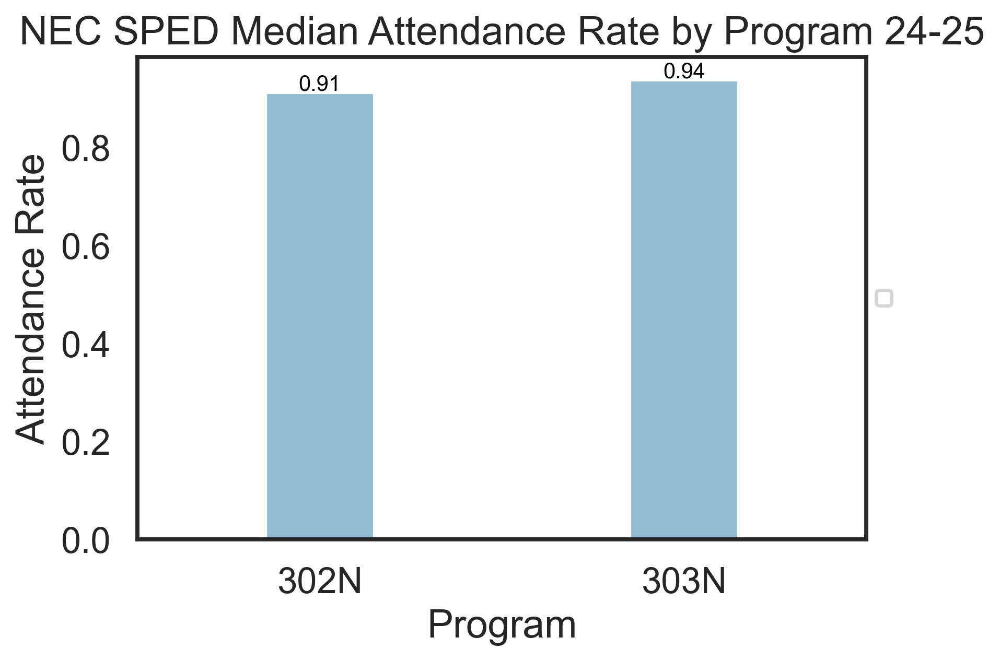

In [197]:
fig = plt.figure(figsize=(6,4))

ax = sns.barplot(x='Program',
            y='Attendance Rate',
              data=nec_attendance_by_program, 
                 color='#89bedc',  
            errorbar=None,
                 width=.3
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'NEC SPED Median Attendance Rate by Program {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/nec_attendance_by_program', bbox_inches='tight')
plt.show()

In [191]:
nec_df.groupby('Program')['Program'].value_counts().to_clipboard()

In [193]:
nec_attendance_by_race=nec_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
nec_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.880117
Asian,0.942244
Black or African American,0.913146
Hispanic,0.906788
Two or More,0.952381
White,0.930849


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\3602659691.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


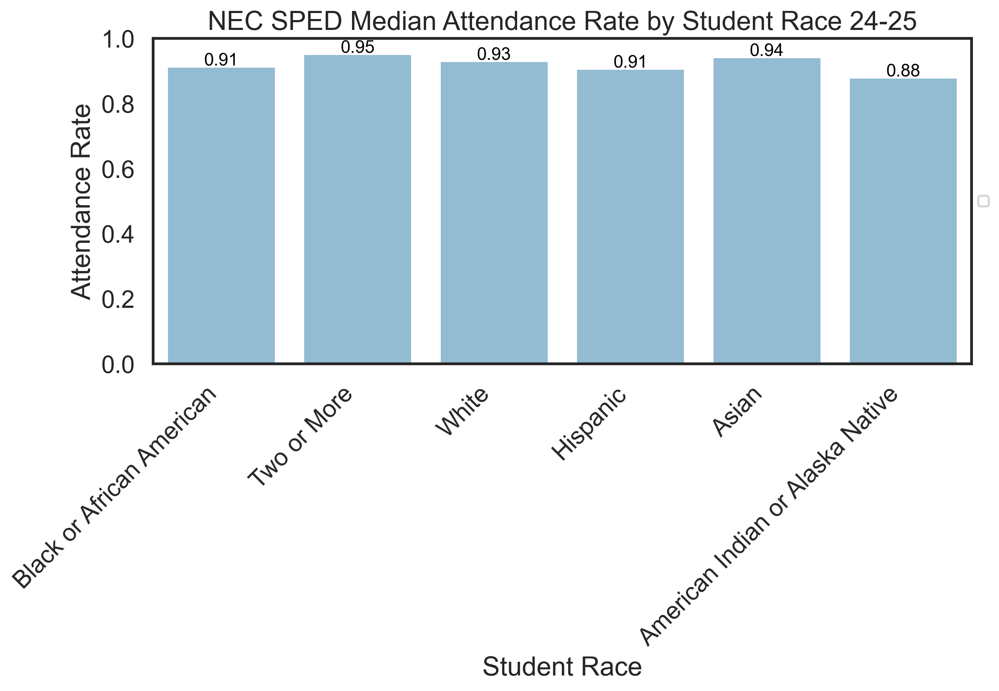

In [196]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
                 x='Student Race',
                 data=nec_attendance_by_race, 
                 color='#89bedc',  
                 order=race_order
                )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=12, color='black')

plt.title(f'NEC SPED Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/nec_attendance_by_race', bbox_inches='tight')
plt.show()

In [205]:
nec_chronic_by_grade=nec_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
nec_chronic_by_grade=nec_chronic_by_grade[nec_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
nec_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
1,01,1.0,0.166667
2,02,1.0,0.538462
5,03,1.0,0.250000
7,04,1.0,0.450000
9,05,1.0,0.428571


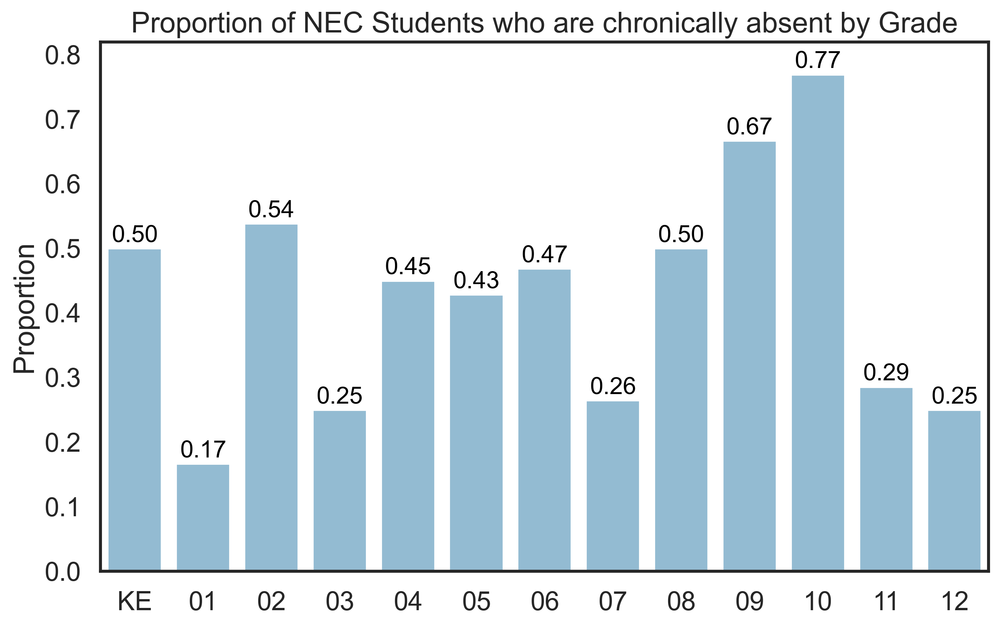

In [207]:
fig = plt.figure(figsize=(10,6))
order=['KE', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

df_to_plot=nec_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of NEC Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/nec_chrnoic_by_grade_2_large', dpi=300, bbox_inches='tight')
plt.show()

In [40]:
nec_grade=nec_df['Grade'].value_counts().sort_index().to_frame()
nec_grade

,count
Grade,
01,15
02,11
03,12
04,17
05,18
06,25
07,30
08,14
09,12


In [41]:
nec_grade.to_clipboard()

In [208]:
nec_chronic_by_race=nec_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
nec_chronic_by_race=nec_chronic_by_race[nec_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
nec_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,0.600000
3,Asian,1.0,0.125000
5,Black or African American,1.0,0.438017
7,Hispanic,1.0,0.470588
9,Two or More,1.0,0.421053


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2581354070.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


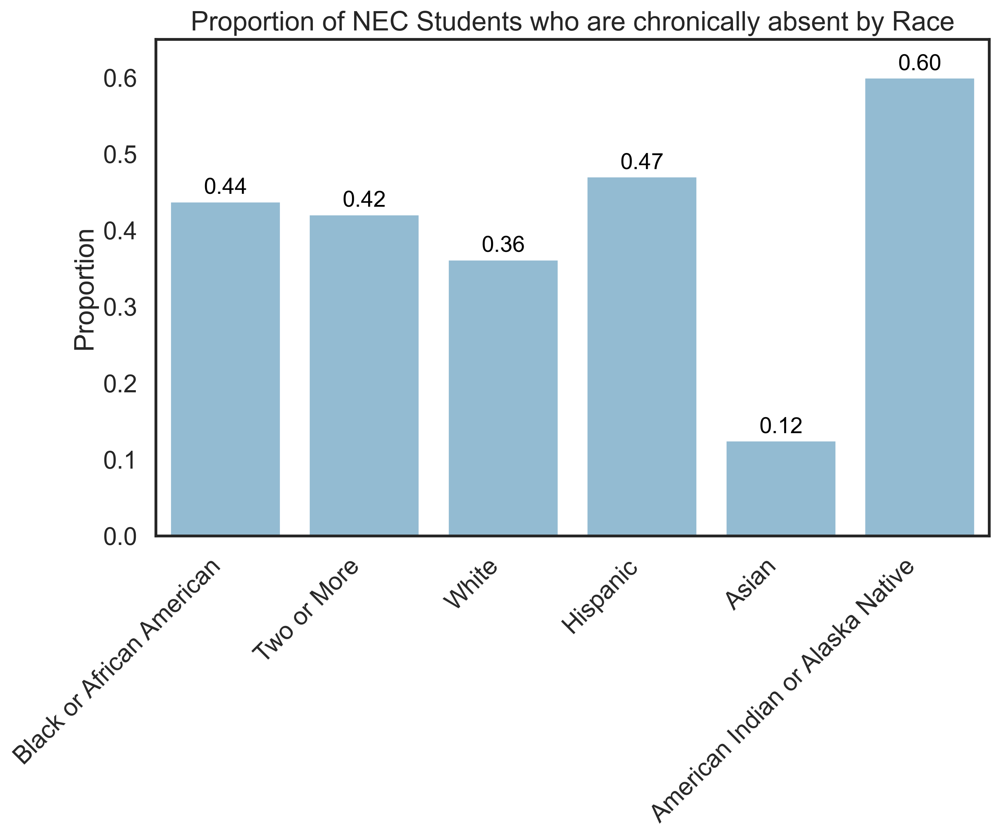

In [211]:
fig = plt.figure(figsize=(10,6))

df_to_plot=nec_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of NEC Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/nec_chrnoic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [41]:
nec_race=nec_df['Student Race'].value_counts().to_frame()
nec_race

,count
Student Race,
Black or African American,103
White,47
Two or More,15
Hispanic,15
Asian,7
American Indian or Alaska Native,5


In [42]:
nec_race.to_clipboard()

In [214]:
nec_chronic_by_language=nec_df.groupby('Language Spoken In the Home')['Chronic Absentee'].value_counts(normalize=True).reset_index()
nec_chronic_by_language=nec_chronic_by_language[nec_chronic_by_language['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
nec_chronic_by_language.head()

,Language Spoken In the Home,Chronic Absentee,Proportion
2,English (011),1.0,0.429268
6,Hmong (020),1.0,0.333333
8,Mandingo (302),1.0,0.333333
11,Somali (069),1.0,0.428571
13,Spanish (045),1.0,0.333333


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1343427963.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


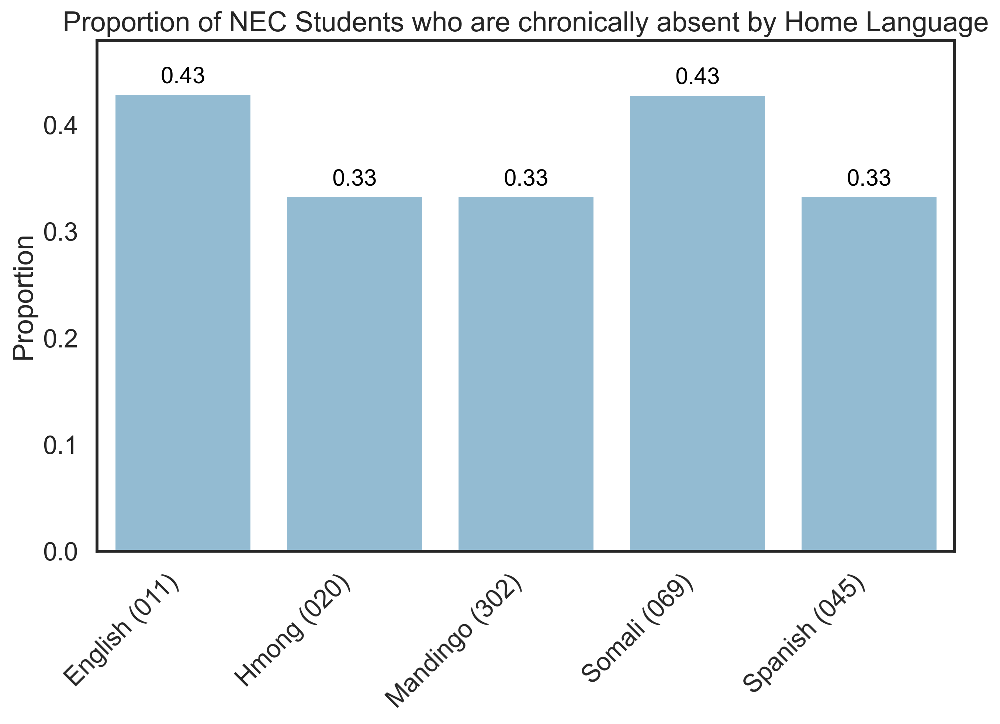

In [217]:
fig = plt.figure(figsize=(10,6))

df_to_plot=nec_chronic_by_language

ax = sns.barplot(x='Language Spoken In the Home',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of NEC Students who are chronically absent by Home Language")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/nec_chrnoic_by_language', dpi=300, bbox_inches='tight')
plt.show()



In [218]:
nec_languages=nec_df['Language Spoken In the Home'].value_counts()
nec_languages

Language Spoken In the Home
English (011)           205
Somali (069)              7
Hmong (020)               3
Mandingo (302)            3
Spanish (045)             3
Arabic (002)              2
French (015)              1
English Creole (057)      1
Sarakole (355)            1
Tamil (118)               1
Telugu (119)              1
Name: count, dtype: int64

In [47]:
nec_languages.to_clipboard()

## SEC

In [219]:
sec_df=df[df['School']=='SEC SPED']

In [220]:
sec_attendance_by_grade=sec_df.groupby('Grade')['Attendance Rate'].median().to_frame()
sec_attendance_by_grade

,Attendance Rate
Grade,
01,0.876467
02,0.903066
03,0.914252
04,0.859859
05,0.942112
06,0.942633
07,0.916750
08,0.827934
09,0.735935


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


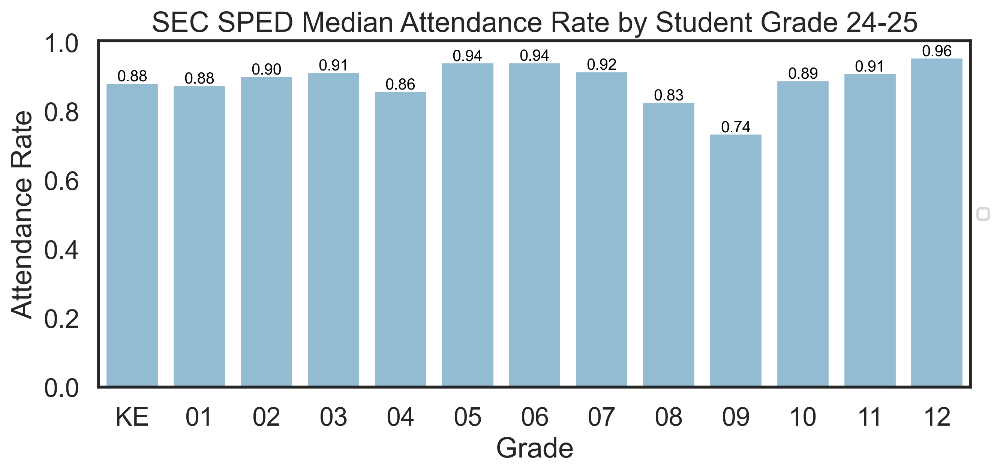

In [222]:
fig = plt.figure(figsize=(10,4))
order=['KE', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=sec_attendance_by_grade, 
                 color='#89bedc', 
            errorbar=None,
                 order=order
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'SEC SPED Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/sec_attendance_by_grade', bbox_inches='tight')
plt.show()

In [223]:
sec_attendance_by_program=sec_df.groupby('Program')['Attendance Rate'].median().to_frame()
sec_attendance_by_program

,Attendance Rate
Program,
302S,0.903620
303S,0.905579
303ST,0.879323


In [52]:
sec_df.groupby('Program')['Program'].value_counts().to_clipboard()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


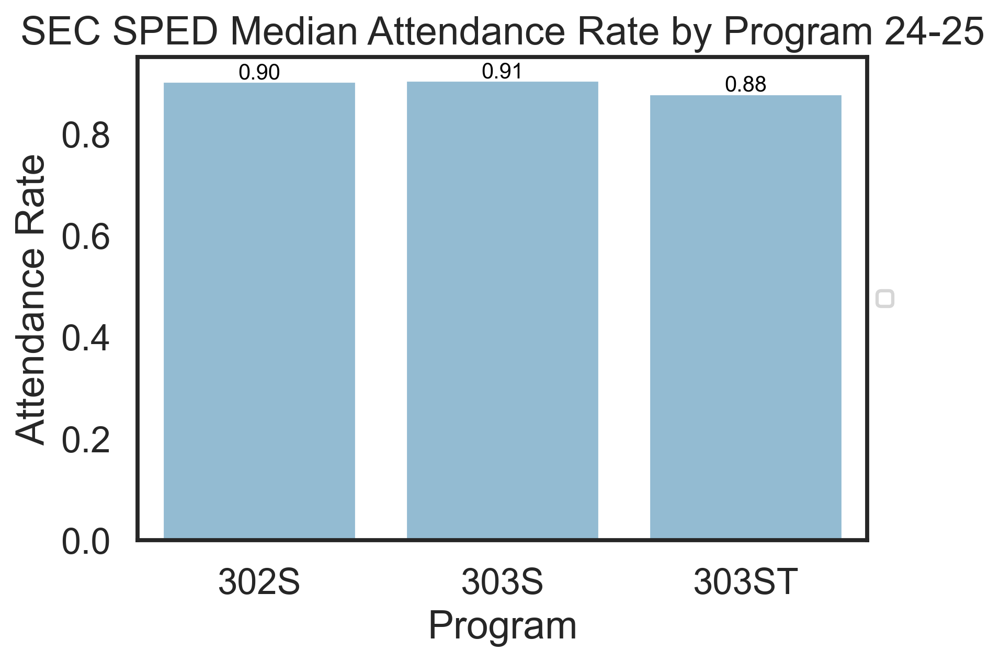

In [225]:
fig = plt.figure(figsize=(6,4))

ax = sns.barplot(x='Program',
            y='Attendance Rate',
              data=sec_attendance_by_program, 
                 color='#89bedc', 
            errorbar=None,
                 # width=.3
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'SEC SPED Median Attendance Rate by Program {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/sec_attendance_by_program', bbox_inches='tight')
plt.show()

In [226]:
sec_attendance_by_race=sec_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
sec_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.483018
Asian,0.953580
Black or African American,0.902466
Hispanic,0.697943
Two or More,0.920885
White,0.902798


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1858022050.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


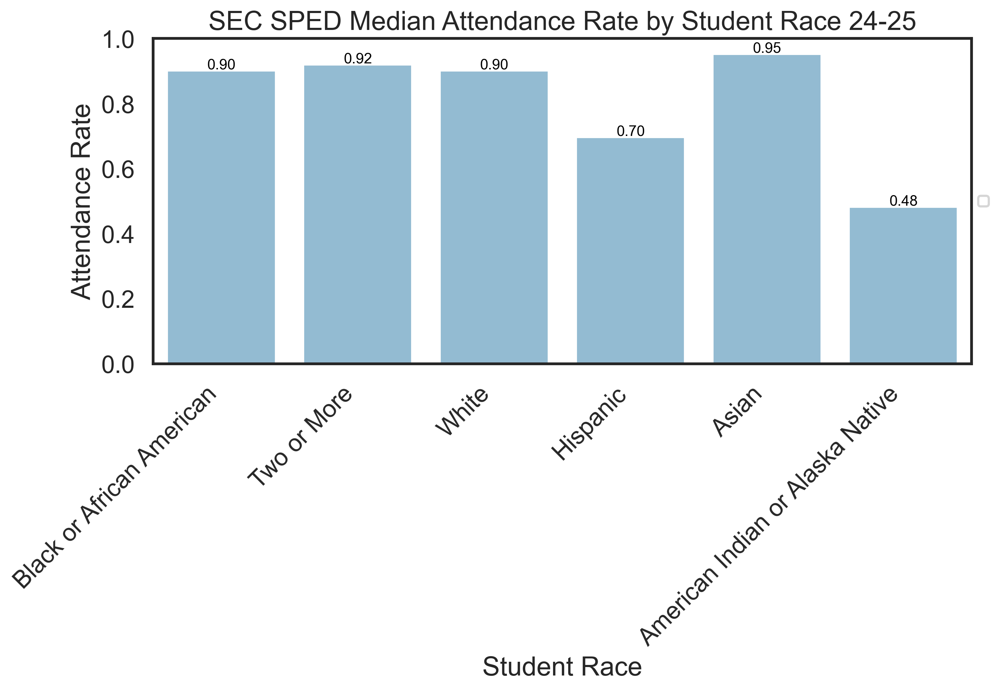

In [228]:
fig = plt.figure(figsize=(10,4))

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=sec_attendance_by_race, 
                 color='#89bedc', 
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'SEC SPED Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/sec_attendance_by_race', bbox_inches='tight')
plt.show()

In [229]:
sec_chronic_by_grade=sec_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
sec_chronic_by_grade=sec_chronic_by_grade[sec_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
sec_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
1,01,1.0,0.500000
3,02,1.0,0.400000
5,03,1.0,0.400000
6,04,1.0,0.529412
9,05,1.0,0.384615


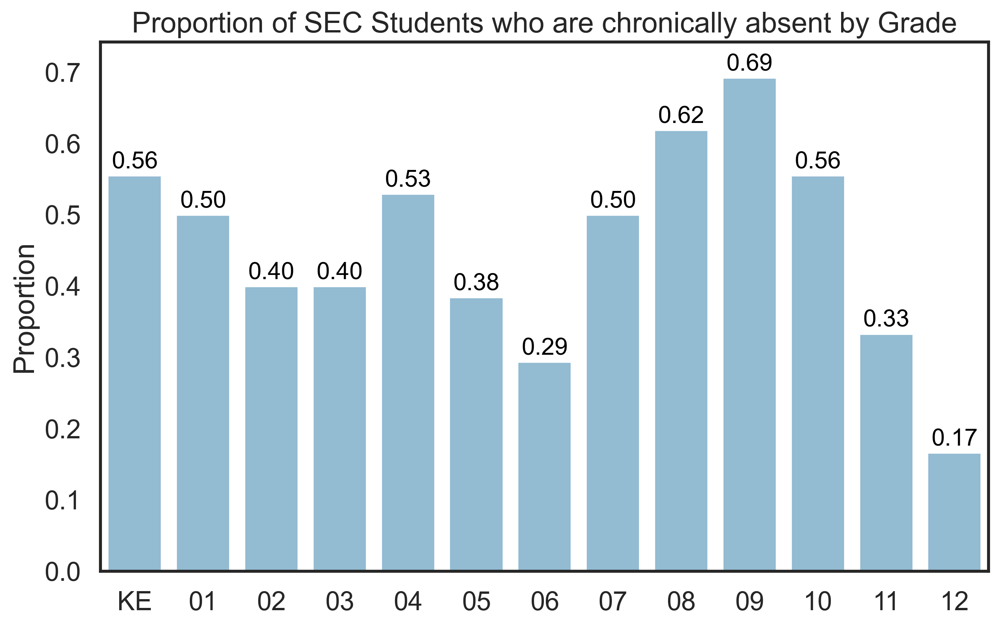

In [230]:
fig = plt.figure(figsize=(10,6))

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

order=['KE', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

df_to_plot=sec_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of SEC Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/sec_chrnoic_by_grade', dpi=300, bbox_inches='tight')
plt.show()



In [59]:
sec_grade=sec_df['Grade'].value_counts().sort_index()
sec_grade

Grade
00-KE     2
01        7
02        7
03        7
04       14
05       11
06       13
07        5
08       19
09       13
10        8
11        7
12        6
15       35
Name: count, dtype: int64

In [60]:
sec_grade.to_clipboard()

In [231]:
sec_chronic_by_race=sec_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
sec_chronic_by_race=sec_chronic_by_race[sec_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
sec_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,0.666667
3,Asian,1.0,0.111111
5,Black or African American,1.0,0.493976
6,Hispanic,1.0,0.700000
9,Two or More,1.0,0.478261


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\105671089.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


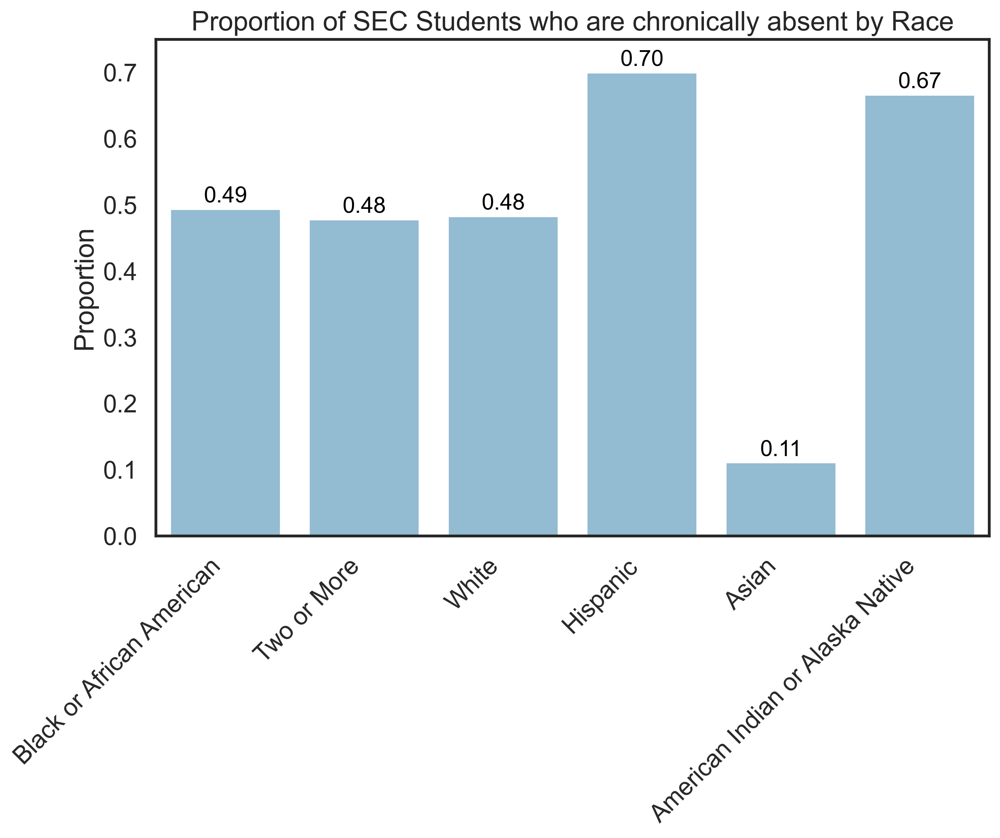

In [232]:
fig = plt.figure(figsize=(10,6))

df_to_plot=sec_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of SEC Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/sec_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [64]:
sec_race=sec_df['Student Race'].value_counts()
sec_race

Student Race
Black or African American           62
White                               52
Two or More                         19
Hispanic                             9
Asian                                9
American Indian or Alaska Native     3
Name: count, dtype: int64

In [65]:
sec_race.to_clipboard()

In [233]:
sec_chronic_by_language=sec_df.groupby('Language Spoken In the Home')['Chronic Absentee'].value_counts(normalize=True).reset_index()
sec_chronic_by_language=sec_chronic_by_language[sec_chronic_by_language['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
sec_chronic_by_language

,Language Spoken In the Home,Chronic Absentee,Proportion
1,English (011),1.0,0.500000
2,French (015),1.0,1.000000
5,Somali (069),1.0,0.416667
7,Spanish (045),1.0,0.500000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1163070179.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


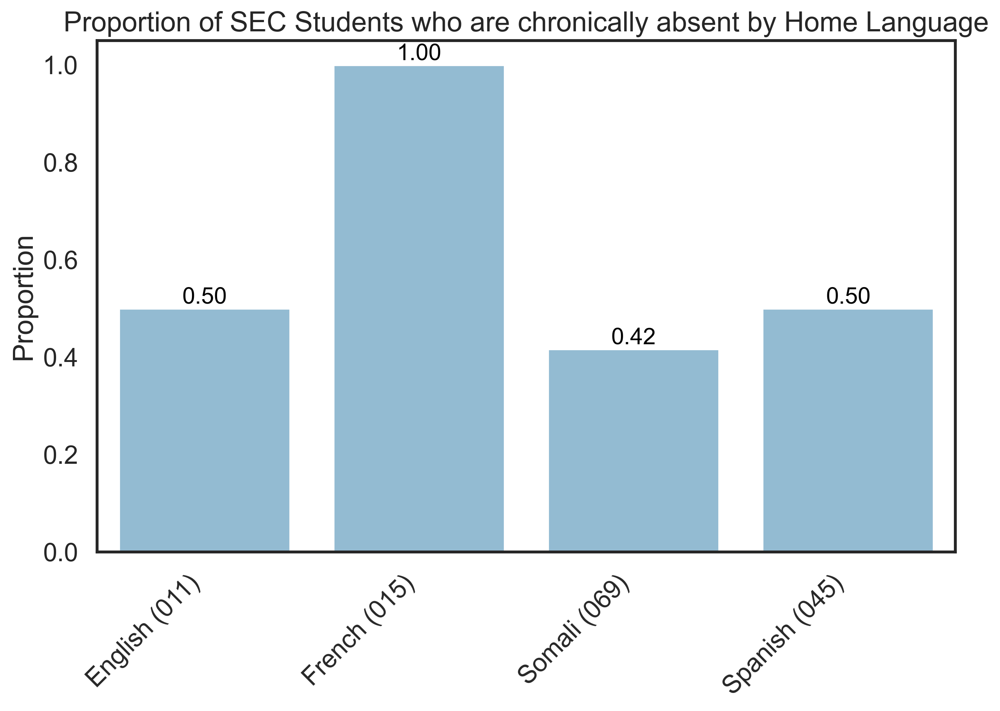

In [234]:
fig = plt.figure(figsize=(10,6))

df_to_plot=sec_chronic_by_language

ax = sns.barplot(x='Language Spoken In the Home',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of SEC Students who are chronically absent by Home Language")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/sec_chronic_by_language', dpi=300, bbox_inches='tight')
plt.show()

In [235]:
sec_languages=sec_df['Language Spoken In the Home'].value_counts()
sec_languages

Language Spoken In the Home
English (011)    156
Somali (069)      24
Spanish (045)      4
French (015)       1
Tamil (118)        1
Malay (124)        1
Tibetan (073)      1
Name: count, dtype: int64

In [68]:
sec_languages.to_clipboard()

## WEC

In [236]:
wec_df=df[df['School']=='WEC SPED']

In [237]:
wec_attendance_by_grade=wec_df.groupby('Grade')['Attendance Rate'].median().to_frame()
wec_attendance_by_grade

,Attendance Rate
Grade,
09,0.795082
10,0.653147
11,0.633621
12,0.607812
15,0.845839


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


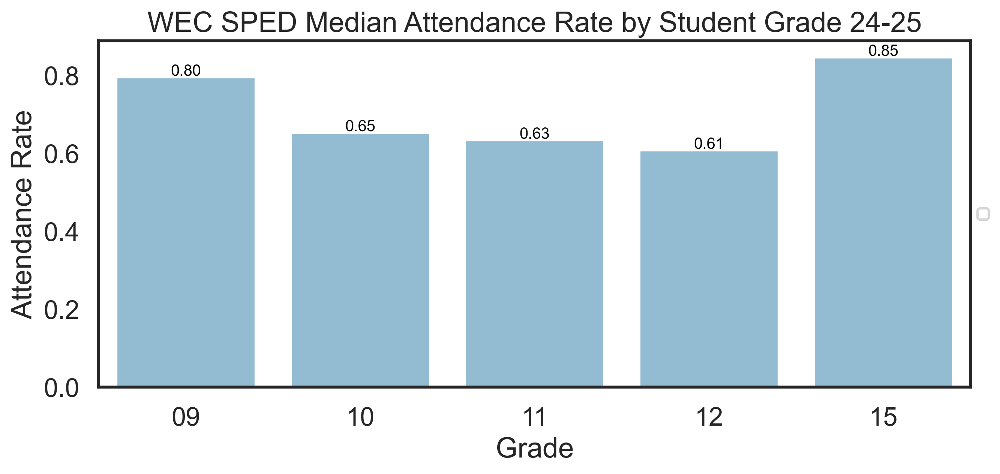

In [239]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=wec_attendance_by_grade, 
                 color='#89bedc',
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'WEC SPED Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/wec_attendance_by_grade', bbox_inches='tight')
plt.show()

In [240]:
wec_attendance_by_program=wec_df.groupby('Program')['Attendance Rate'].median().to_frame()
wec_attendance_by_program

,Attendance Rate
Program,
302W,0.632028
302WT,0.850865
303W,0.704181
303WT,0.765000


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


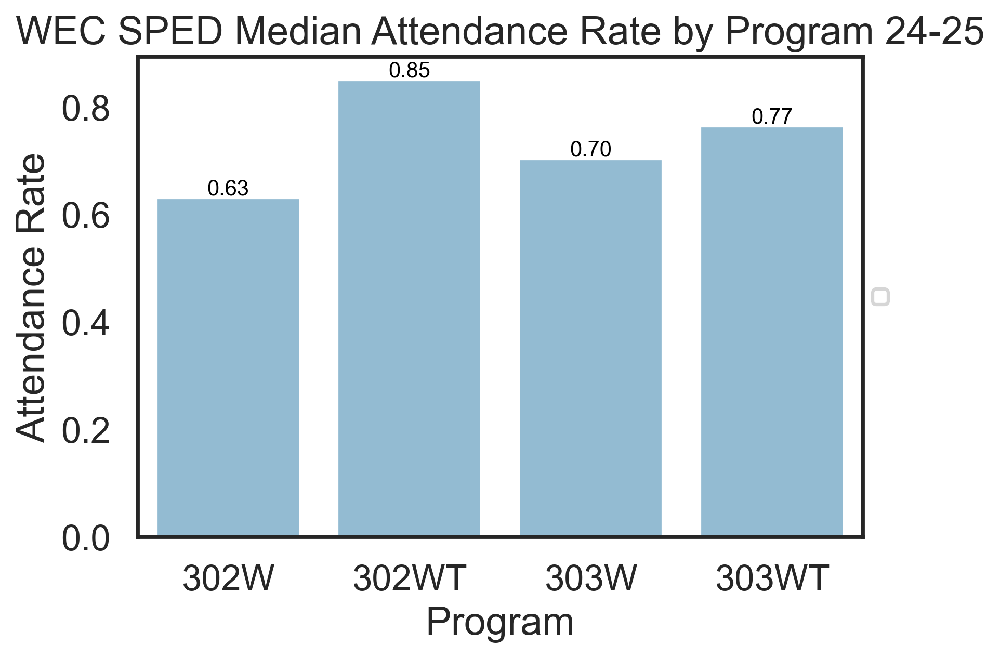

In [242]:
fig = plt.figure(figsize=(6,4))

ax = sns.barplot(x='Program',
            y='Attendance Rate',
              data=wec_attendance_by_program,
                 color='#89bedc',
            errorbar=None,
                 # width=.4
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'WEC SPED Median Attendance Rate by Program {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/wec_attendance_by_program', bbox_inches='tight')
plt.show()

In [74]:
wec_df['Program'].value_counts().to_clipboard()

In [243]:
wec_attendance_by_race=wec_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
wec_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.870000
Asian,0.656609
Black or African American,0.682877
Hispanic,0.574836
Native Hawaiian or Other Pacific Islander,0.932862
Two or More,0.635731
White,0.795082


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1084106636.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


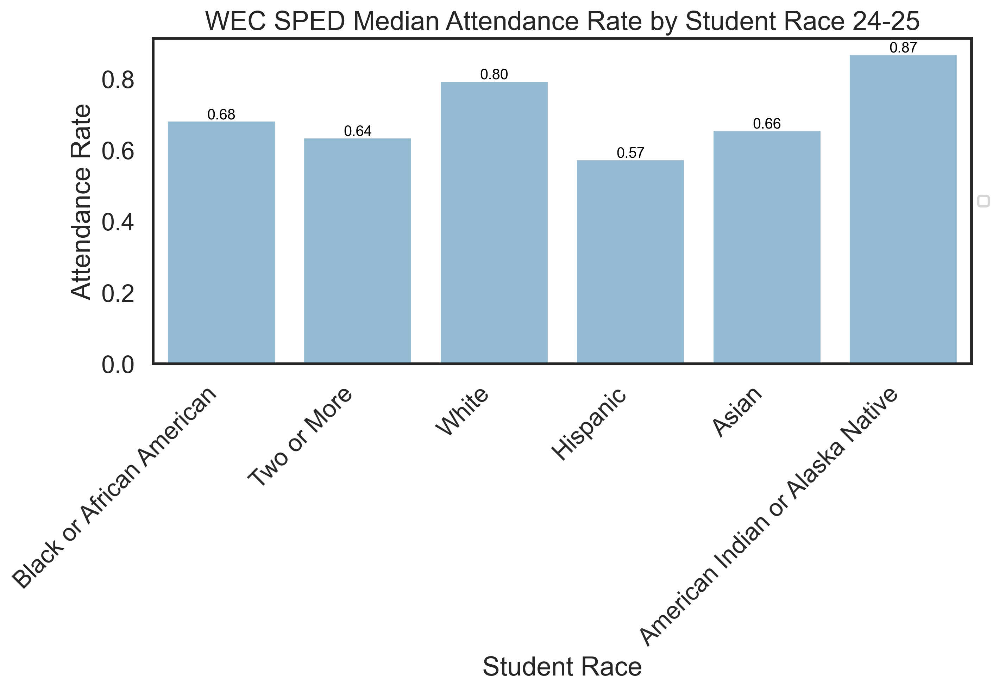

In [244]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=wec_attendance_by_race, 
                 color='#89bedc',
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'WEC SPED Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/wec_attendance_by_race', bbox_inches='tight')
plt.show()

In [245]:
wec_chronic_by_grade=wec_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
wec_chronic_by_grade=wec_chronic_by_grade[wec_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
wec_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
0,09,1.0,0.777778
2,10,1.0,0.888889
4,11,1.0,0.941176
6,12,1.0,0.916667
8,15,1.0,0.680000


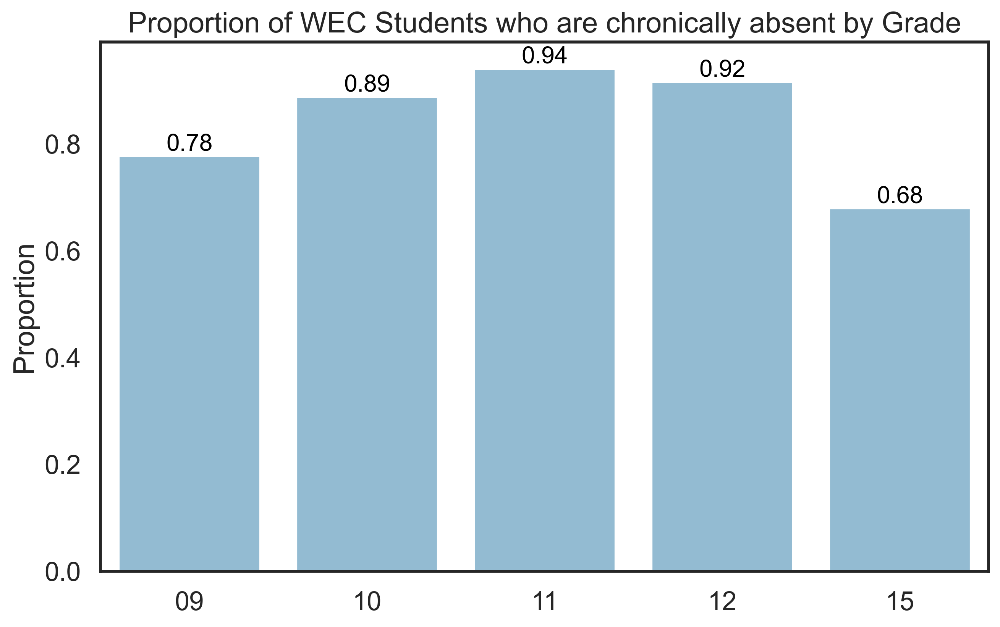

In [247]:
fig = plt.figure(figsize=(10,6))

# order=['KE', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

df_to_plot=wec_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of WEC Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/wec_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()


In [80]:
wec_grade=wec_df['Grade'].value_counts().sort_index()
wec_grade.to_clipboard()

In [248]:
wec_chronic_by_race=wec_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
wec_chronic_by_race=wec_chronic_by_race[wec_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
wec_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,1.000000
1,Asian,1.0,0.800000
3,Black or African American,1.0,0.833333
5,Hispanic,1.0,0.666667
8,Native Hawaiian or Other Pacific Islander,1.0,0.500000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\4209153745.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


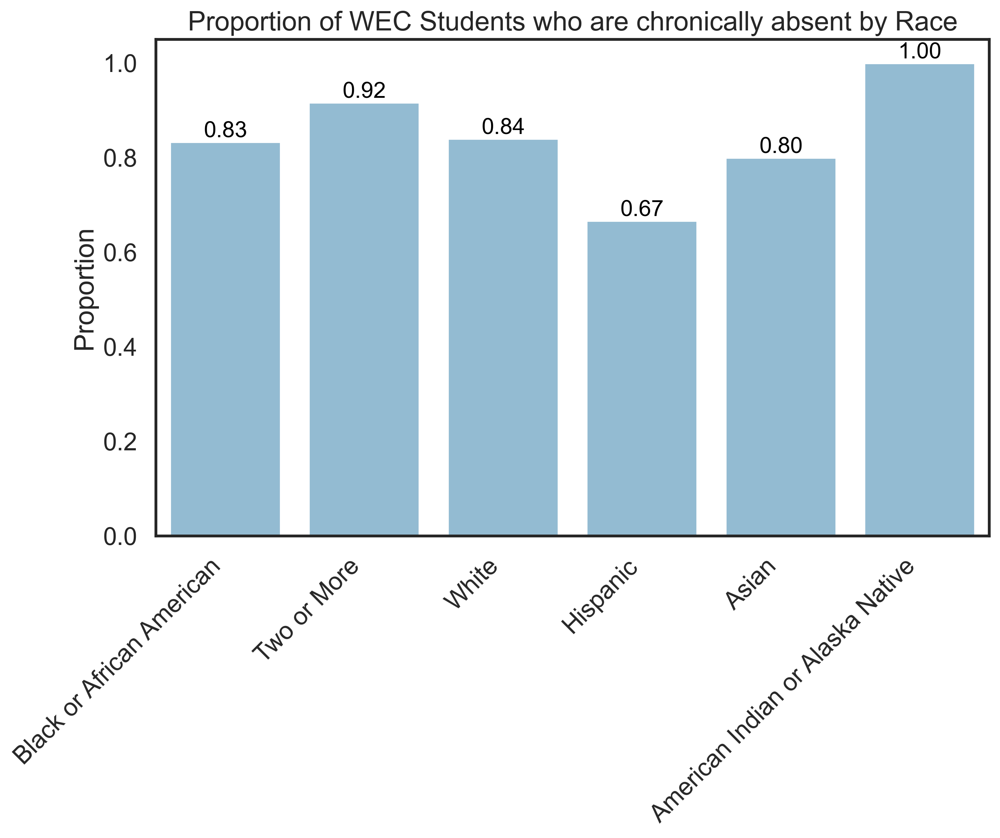

In [249]:
fig = plt.figure(figsize=(10,6))

df_to_plot=wec_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of WEC Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/wec_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [84]:
wec_race=wec_df['Student Race'].value_counts()
wec_race

Student Race
White                                        24
Black or African American                    22
Asian                                         4
Two or More                                   4
Hispanic                                      4
Native Hawaiian or Other Pacific Islander     2
American Indian or Alaska Native              1
Name: count, dtype: int64

In [85]:
wec_race.to_clipboard()

In [250]:
wec_chronic_by_language=wec_df.groupby('Language Spoken In the Home')['Chronic Absentee'].value_counts(normalize=True).reset_index()
wec_chronic_by_language=wec_chronic_by_language[wec_chronic_by_language['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
wec_chronic_by_language.head()

,Language Spoken In the Home,Chronic Absentee,Proportion
1,English (011),1.0,0.84507
3,Somali (069),1.0,0.75000
5,Spanish (045),1.0,1.00000
6,Thai (047),1.0,1.00000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2309938974.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


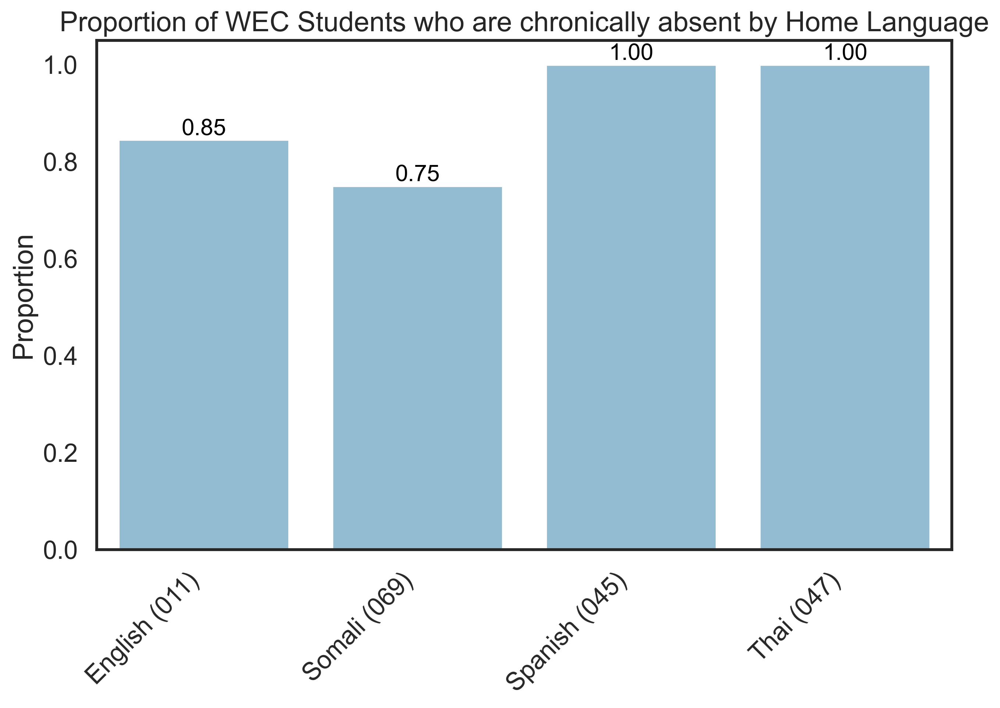

In [251]:
fig = plt.figure(figsize=(10,6))

df_to_plot=wec_chronic_by_language

ax = sns.barplot(x='Language Spoken In the Home',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of WEC Students who are chronically absent by Home Language")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/wec_chronic_by_language', dpi=300, bbox_inches='tight')
plt.show()

In [252]:
wec_languages=wec_df['Language Spoken In the Home'].value_counts()
wec_languages

Language Spoken In the Home
English (011)    71
Somali (069)      4
Thai (047)        2
Spanish (045)     1
Amharic (063)     1
Tibetan (073)     1
Name: count, dtype: int64

In [88]:
wec_languages.to_clipboard()

## NECA

In [253]:
neca_df=df[df['School']=='NECA']

In [254]:
neca_attendance_by_grade=neca_df.groupby('Grade')['Attendance Rate'].median().to_frame()
neca_attendance_by_grade

,Attendance Rate
Grade,
09,0.594307
10,0.456006
11,0.532827
12,0.487783
14,0.159780


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


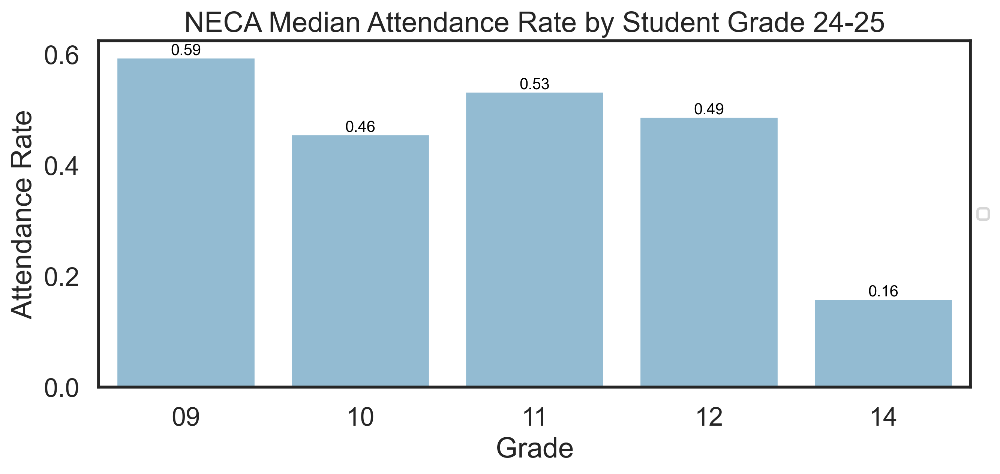

In [255]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=neca_attendance_by_grade, 
                 color='#89bedc', 
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'NECA Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/neca_attendance_by_grade', bbox_inches='tight')
plt.show()

In [97]:
neca_grade=neca_df['Grade'].value_counts().sort_index()
neca_grade.to_clipboard()

In [256]:
neca_attendance_by_race=neca_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
neca_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.514343
Asian,0.512153
Black or African American,0.379499
Hispanic,0.543125
Two or More,0.222222
White,0.389182


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\3828208349.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


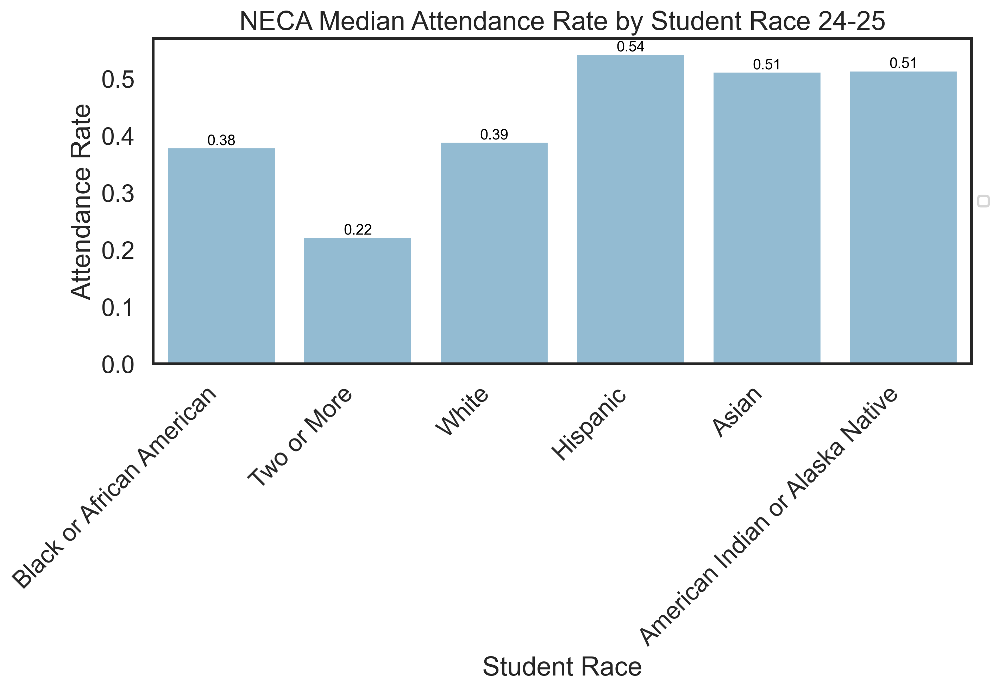

In [257]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=neca_attendance_by_race, 
                 color='#89bedc', 
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'NECA Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/neca_attendance_by_race', bbox_inches='tight')
plt.show()

In [258]:
neca_chronic_by_grade=neca_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
neca_chronic_by_grade=neca_chronic_by_grade[neca_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
neca_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
0,09,1.0,1.000000
1,10,1.0,0.875000
3,11,1.0,1.000000
4,12,1.0,0.884615
6,14,1.0,0.928571


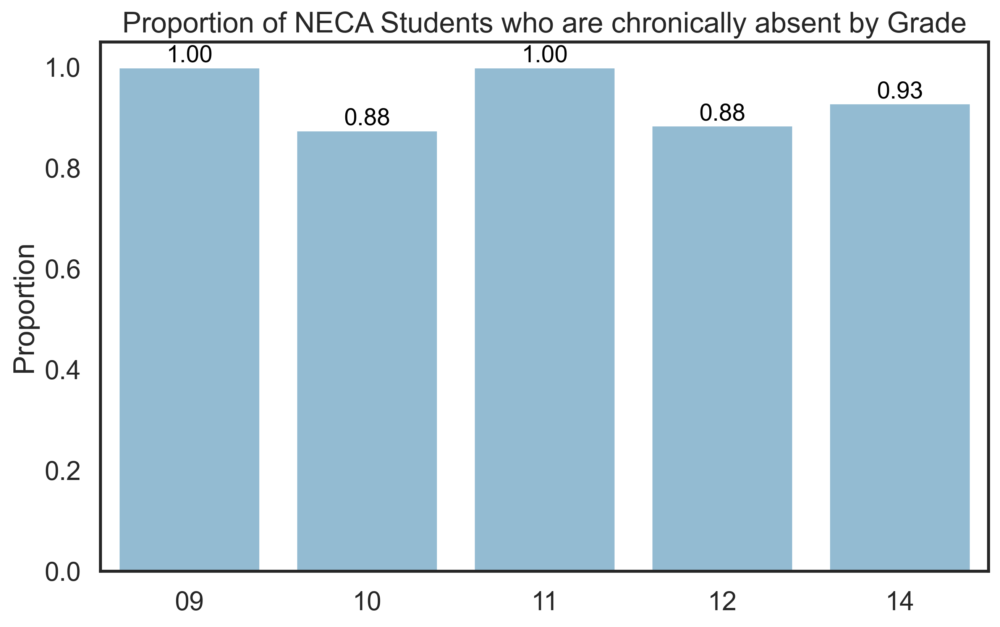

In [259]:
fig = plt.figure(figsize=(10,6))

df_to_plot=neca_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of NECA Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/neca_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()

In [260]:
neca_chronic_by_race=neca_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
neca_chronic_by_race=neca_chronic_by_race[neca_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
neca_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,1.000000
2,Asian,1.0,0.500000
3,Black or African American,1.0,0.974359
5,Hispanic,1.0,0.833333
7,Two or More,1.0,0.857143


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1672801298.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


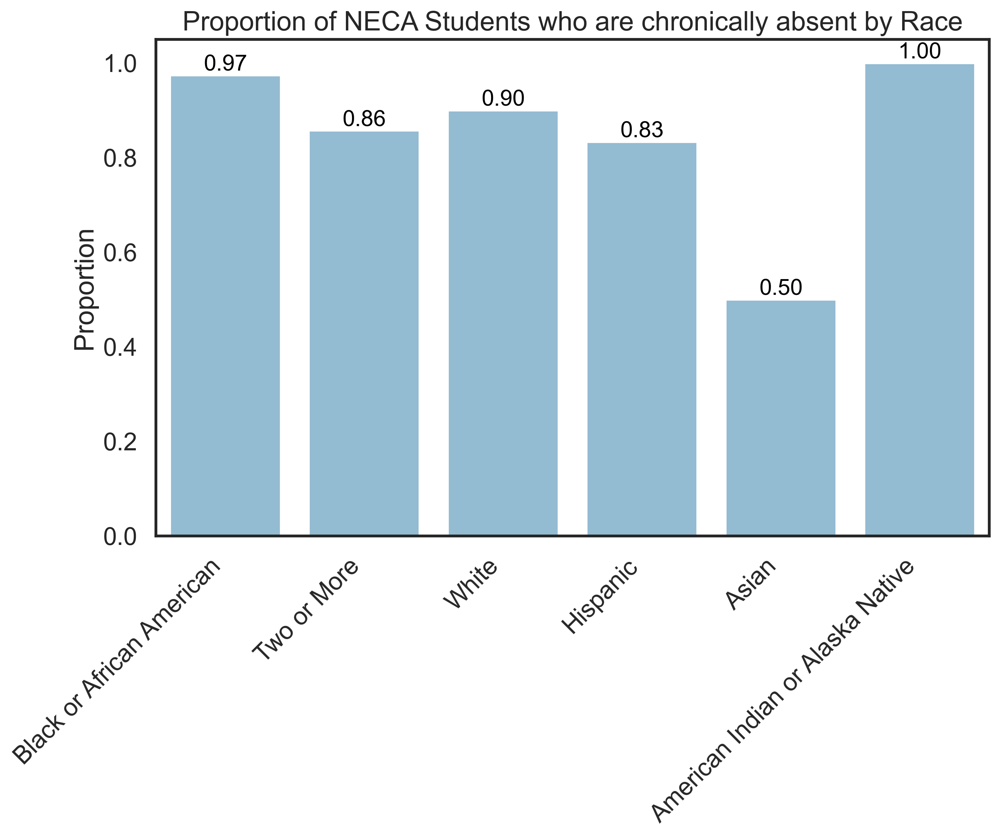

In [261]:
fig = plt.figure(figsize=(10,6))

df_to_plot=neca_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of NECA Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/neca_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()


In [101]:
neca_race=neca_df['Student Race'].value_counts()
neca_race

Student Race
Black or African American           27
White                                6
Two or More                          5
Hispanic                             4
American Indian or Alaska Native     2
Asian                                1
Name: count, dtype: int64

In [102]:
neca_race.to_clipboard()

In [262]:
neca_chronic_by_language=neca_df.groupby('Language Spoken In the Home')['Chronic Absentee'].value_counts(normalize=True).reset_index()
neca_chronic_by_language=neca_chronic_by_language[neca_chronic_by_language['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
neca_chronic_by_language.head()

,Language Spoken In the Home,Chronic Absentee,Proportion
0,English (011),1.0,0.950820
3,Somali (069),1.0,1.000000
4,Spanish (045),1.0,0.666667


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1485014105.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


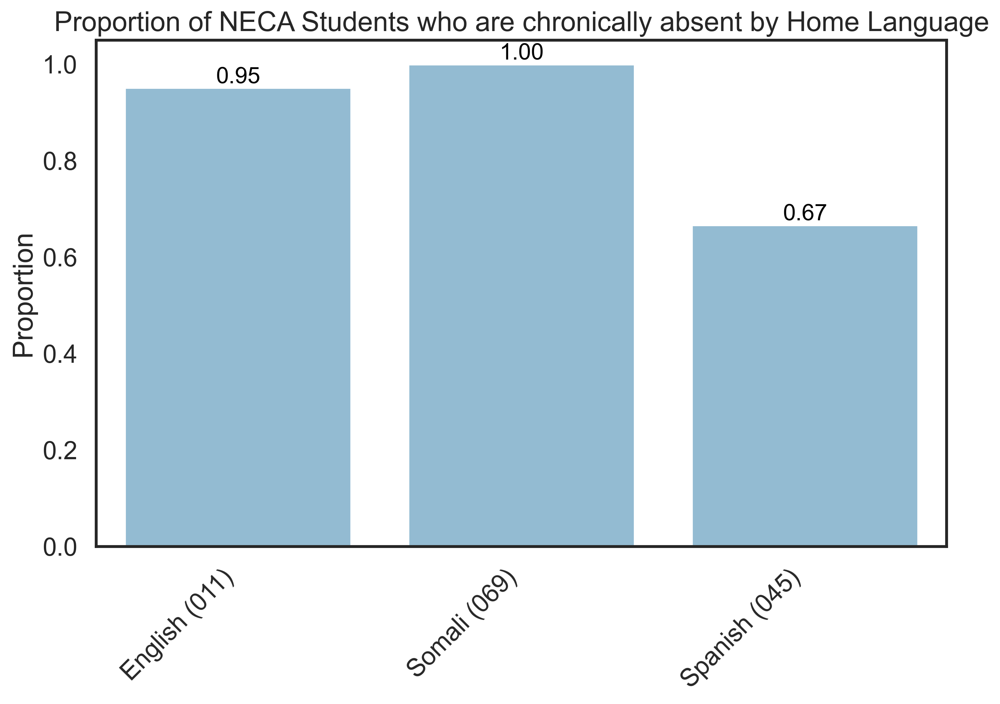

In [263]:
fig = plt.figure(figsize=(10,6))

df_to_plot=neca_chronic_by_language

ax = sns.barplot(x='Language Spoken In the Home',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of NECA Students who are chronically absent by Home Language")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/neca_chronic_by_language', dpi=300, bbox_inches='tight')
plt.show()


In [264]:
neca_languages=neca_df['Language Spoken In the Home'].value_counts()
neca_languages

Language Spoken In the Home
English (011)    61
Spanish (045)     3
Hmong (020)       1
Somali (069)      1
Name: count, dtype: int64

In [105]:
neca_languages.to_clipboard()

## SECA

In [265]:
seca_df=df[df['School']=='SECA']

In [266]:
seca_attendance_by_grade=seca_df.groupby('Grade')['Attendance Rate'].median().to_frame()
seca_attendance_by_grade

,Attendance Rate
Grade,
09,0.349532
10,0.399606
11,0.277401
12,0.201389
14,0.167705


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


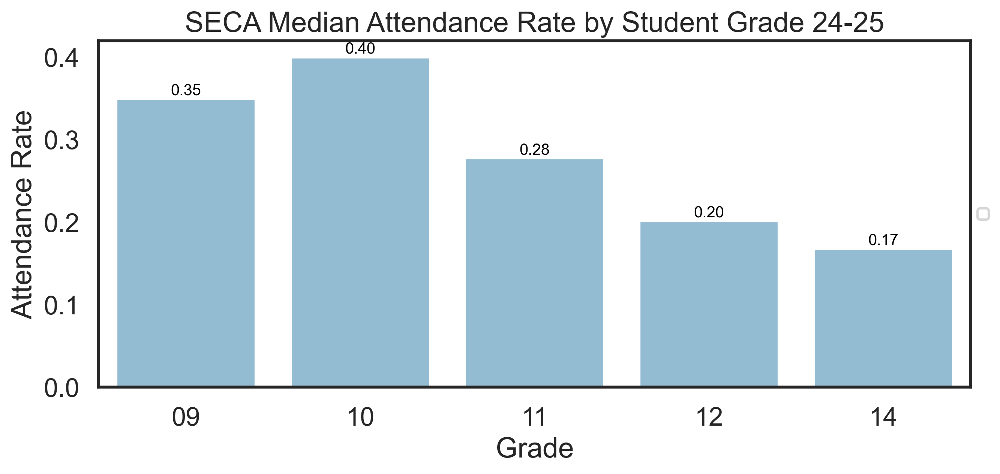

In [268]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=seca_attendance_by_grade, 
                 color='#89bedc', 
            errorbar=None
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'SECA Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/seca_attendance_by_grade', bbox_inches='tight')
plt.show()

In [269]:
seca_attendance_by_race=seca_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
seca_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.125519
Asian,0.201389
Black or African American,0.272475
Hispanic,0.313034
Two or More,0.336909
White,0.292553


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\776129541.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


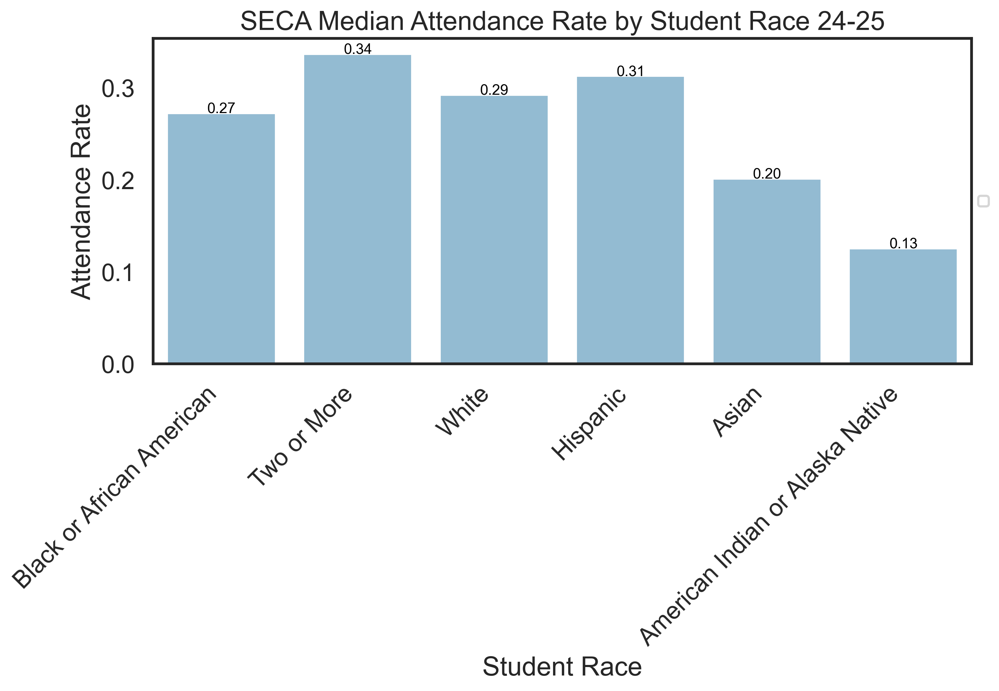

In [271]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=seca_attendance_by_race, 
                 color='#89bedc', 
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .0005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'SECA Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/seca_attendance_by_race', bbox_inches='tight')
plt.show()

In [272]:
seca_chronic_by_grade=seca_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
seca_chronic_by_grade=seca_chronic_by_grade[seca_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
seca_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
0,09,1.0,1.000000
1,10,1.0,1.000000
2,11,1.0,0.954545
4,12,1.0,0.960000
6,14,1.0,0.937500


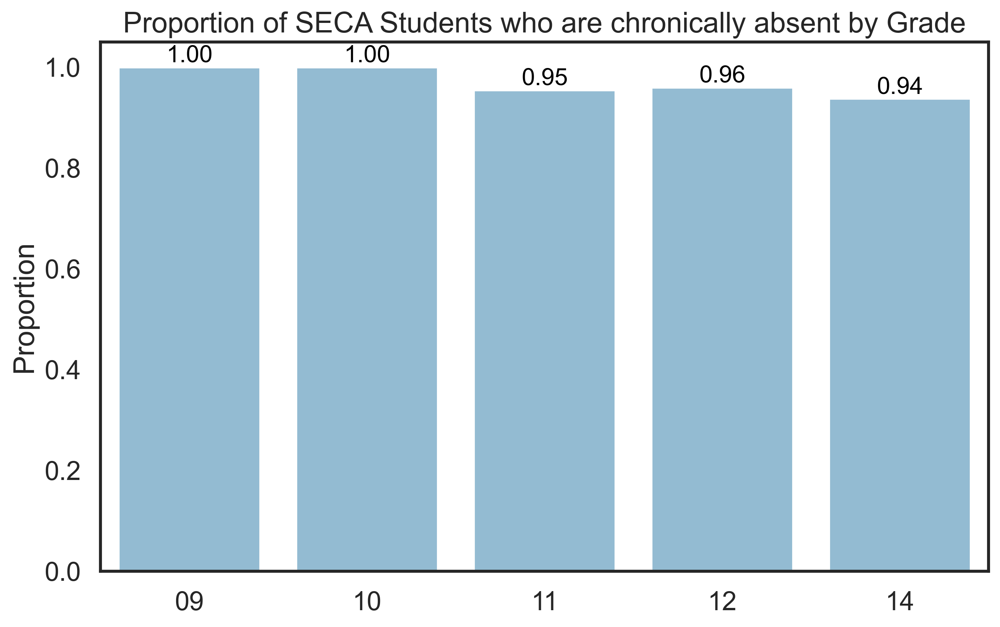

In [274]:
fig = plt.figure(figsize=(10,6))

df_to_plot=seca_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of SECA Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/seca_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()

In [114]:
seca_grade=seca_df['Grade'].value_counts().sort_index()
seca_grade.to_clipboard()

In [275]:
seca_chronic_by_race=seca_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
seca_chronic_by_race=seca_chronic_by_race[seca_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
seca_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,1.000000
1,Asian,1.0,1.000000
2,Black or African American,1.0,0.956522
4,Hispanic,1.0,0.972973
6,Two or More,1.0,0.900000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\3169493435.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


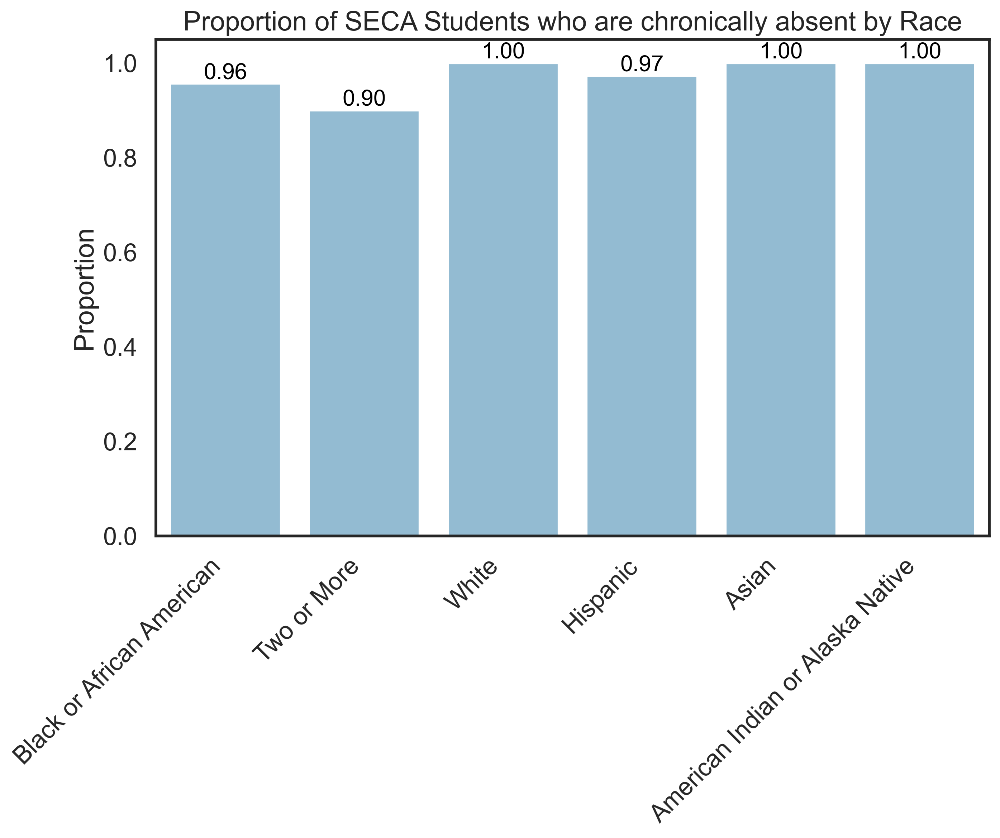

In [276]:
fig = plt.figure(figsize=(10,6))

df_to_plot=seca_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of SECA Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/seca_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [118]:
seca_race=seca_df['Student Race'].value_counts()
seca_race

Student Race
Hispanic                            24
Black or African American           15
White                                9
Two or More                          5
American Indian or Alaska Native     2
Asian                                1
Name: count, dtype: int64

In [119]:
seca_race.to_clipboard()

In [277]:
seca_chronic_by_language=seca_df.groupby('Language Spoken In the Home')['Chronic Absentee'].value_counts(normalize=True).reset_index()
seca_chronic_by_language=seca_chronic_by_language[seca_chronic_by_language['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
seca_chronic_by_language.head()

,Language Spoken In the Home,Chronic Absentee,Proportion
0,English (011),1.0,0.962963
2,Somali (069),1.0,1.000000
3,Spanish (045),1.0,0.954545


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1102813286.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


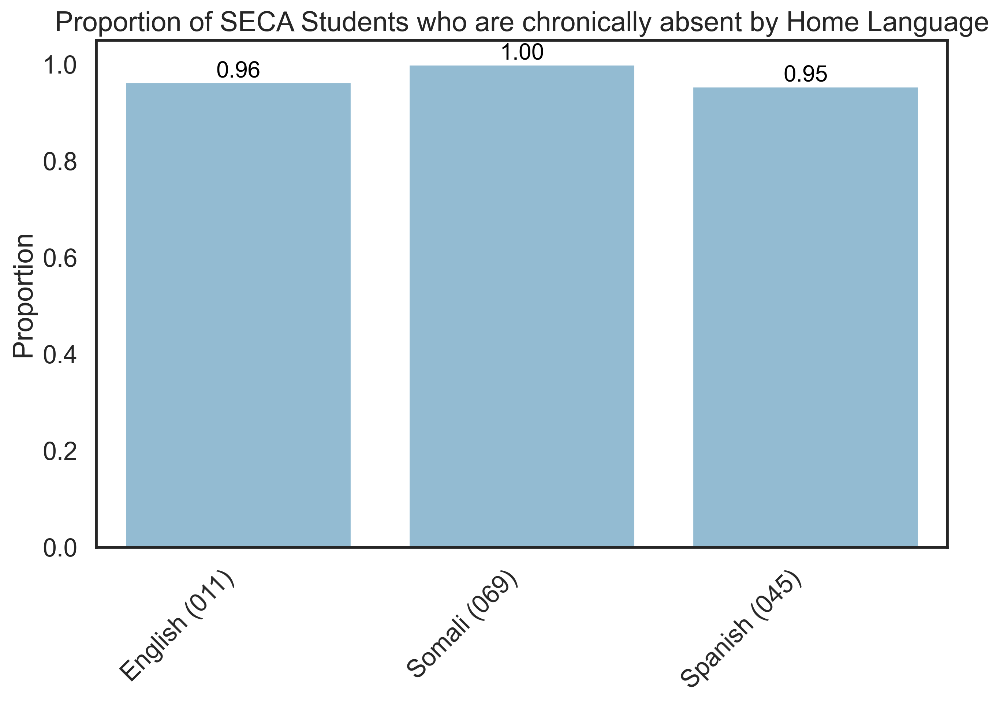

In [278]:
fig = plt.figure(figsize=(10,6))

df_to_plot=seca_chronic_by_language

ax = sns.barplot(x='Language Spoken In the Home',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of SECA Students who are chronically absent by Home Language")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/seca_chronic_by_language', dpi=300, bbox_inches='tight')
plt.show()

In [121]:
seca_languages=seca_df['Language Spoken In the Home'].value_counts()
seca_languages

Language Spoken In the Home
English (011)    37
Spanish (045)    14
Somali (069)      4
Name: count, dtype: int64

In [122]:
seca_languages.to_clipboard()

## W-ALT

In [279]:
walt_df=df[df['School']=='W-ALT']

In [280]:
walt_attendance_by_grade=walt_df.groupby('Grade')['Attendance Rate'].median().to_frame()
walt_attendance_by_grade

,Attendance Rate
Grade,
09,0.668650
10,0.655843
11,0.560006
12,0.556271
14,0.350646


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


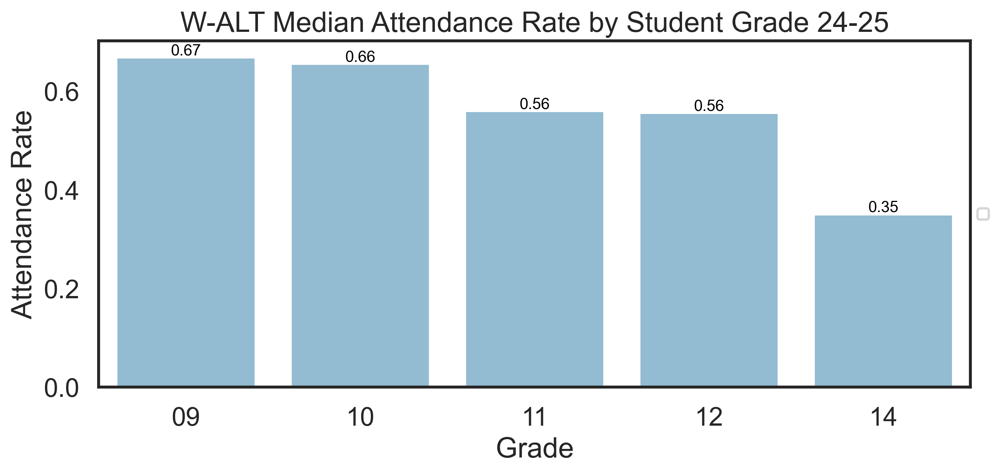

In [281]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=walt_attendance_by_grade, 
                 color='#89bedc', 
            errorbar=None
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'W-ALT Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/walt_attendance_by_grade', bbox_inches='tight')
plt.show()

In [282]:
walt_attendance_by_race=walt_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
walt_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.187480
Asian,0.107222
Black or African American,0.483690
Hispanic,0.456863
Two or More,0.583937
White,0.618318


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2130595932.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


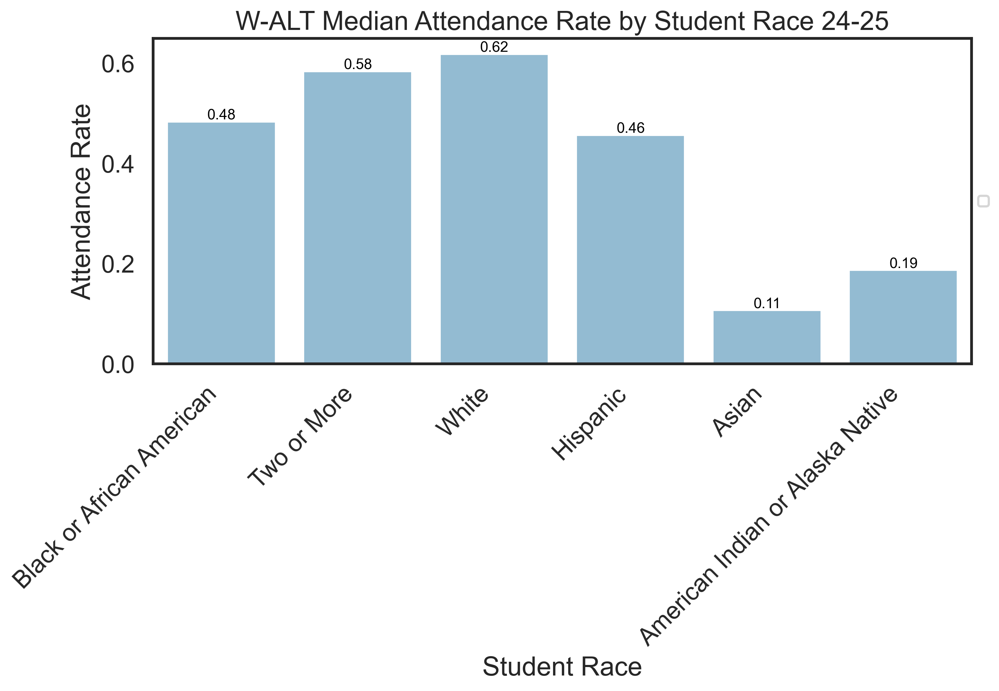

In [283]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=walt_attendance_by_race, 
                 color='#89bedc', 
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'W-ALT Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/walt_attendance_by_race', bbox_inches='tight')
plt.show()

In [284]:
walt_chronic_by_grade=walt_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
walt_chronic_by_grade=walt_chronic_by_grade[walt_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
walt_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
1,09,1.0,0.500000
2,10,1.0,0.928571
4,11,1.0,0.937500
6,12,1.0,1.000000
7,14,1.0,0.754386


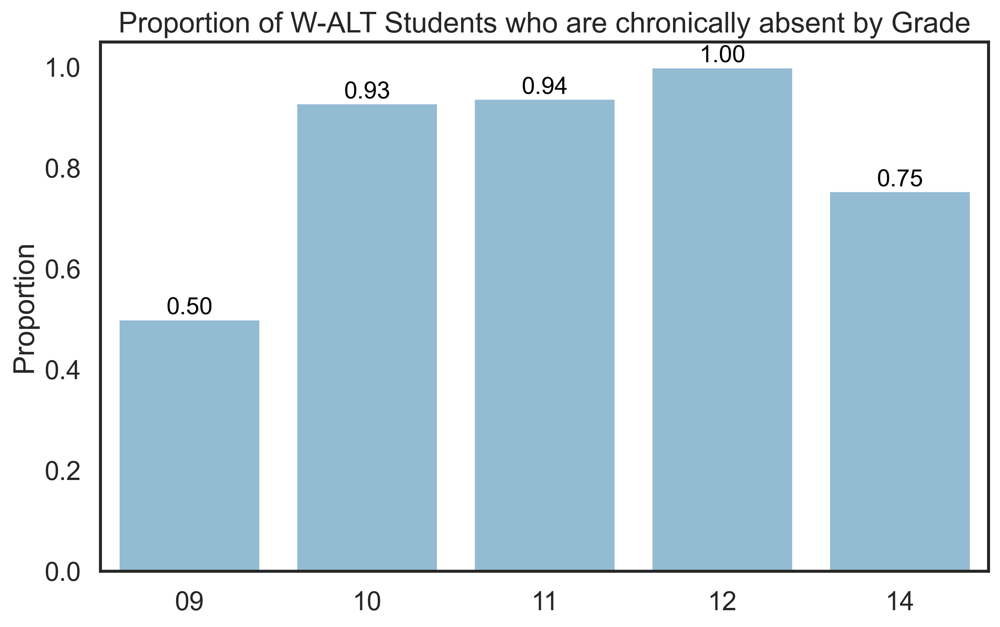

In [285]:
fig = plt.figure(figsize=(10,6))

df_to_plot=walt_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of W-ALT Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/walt_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()

In [131]:
walt_grade=walt_df['Grade'].value_counts().sort_index()
walt_grade.to_clipboard()

In [286]:
walt_chronic_by_race=walt_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
walt_chronic_by_race=walt_chronic_by_race[walt_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
walt_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,1.000000
1,Asian,1.0,1.000000
2,Black or African American,1.0,0.862069
4,Hispanic,1.0,0.840000
6,Two or More,1.0,0.904762


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2443066451.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


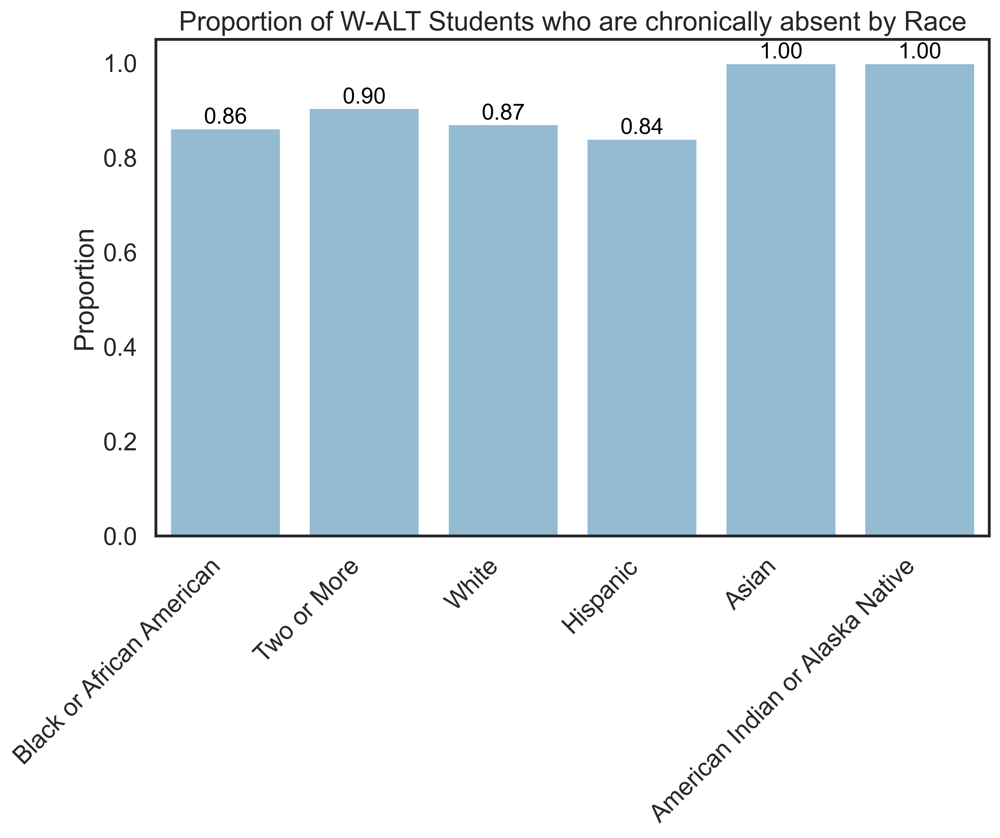

In [287]:
fig = plt.figure(figsize=(10,6))

df_to_plot=walt_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of W-ALT Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/walt_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [288]:
walt_race=walt_df['Student Race'].value_counts()
walt_race

Student Race
Black or African American           58
White                               31
Hispanic                            25
Two or More                         21
Asian                                5
American Indian or Alaska Native     2
Name: count, dtype: int64

In [136]:
walt_race.to_clipboard()

In [289]:
walt_chronic_by_language=walt_df.groupby('Language Spoken In the Home')['Chronic Absentee'].value_counts(normalize=True).reset_index()
walt_chronic_by_language=walt_chronic_by_language[walt_chronic_by_language['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
walt_chronic_by_language.head()

,Language Spoken In the Home,Chronic Absentee,Proportion
1,English (011),1.0,0.903846
4,English Creole (057),1.0,0.500000
5,Ewe (158),1.0,1.000000
6,Hmong (020),1.0,1.000000
7,Lithuanian (031),1.0,1.000000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1868961437.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


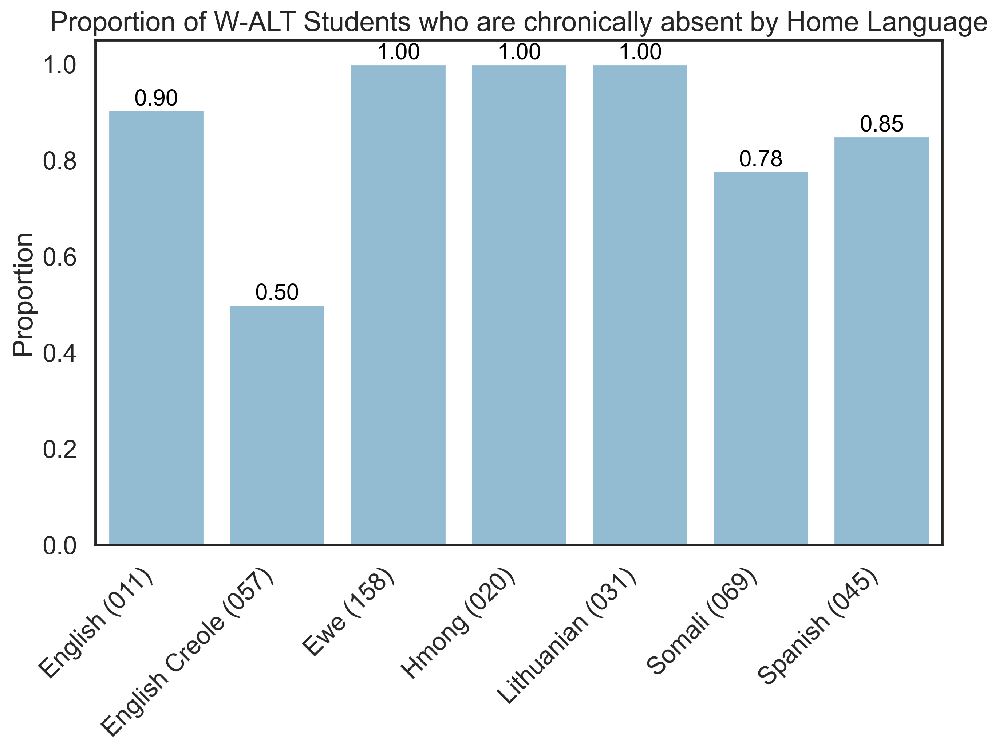

In [290]:
fig = plt.figure(figsize=(10,6))

df_to_plot=walt_chronic_by_language

ax = sns.barplot(x='Language Spoken In the Home',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of W-ALT Students who are chronically absent by Home Language")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/walt_chronic_by_language', dpi=300, bbox_inches='tight')
plt.show()

In [291]:
walt_languages=walt_df['Language Spoken In the Home'].value_counts()
walt_languages

Language Spoken In the Home
English (011)                   104
Spanish (045)                    20
Somali (069)                      9
Hmong (020)                       3
English Creole (057)              2
Oromo (074)                       1
Lithuanian (031)                  1
American Sign Language (042)      1
Ewe (158)                         1
Name: count, dtype: int64

In [139]:
walt_languages.to_clipboard()

## ABEC

In [292]:
abec_df=df[df['School']=='ABEC']

In [293]:
abec_attendance_by_grade=abec_df.groupby('Grade')['Attendance Rate'].median().to_frame()
abec_attendance_by_grade

,Attendance Rate
Grade,
08,0.885281
09,0.833627
10,0.834512
11,0.793134
12,0.843699
15,0.913462


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


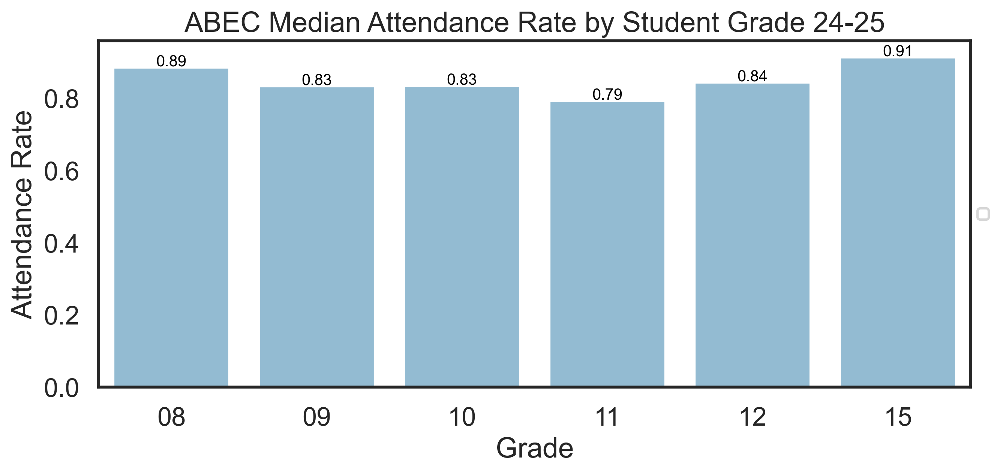

In [294]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=abec_attendance_by_grade, 
                 color='#89bedc',
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'ABEC Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/abec_attendance_by_grade', bbox_inches='tight')
plt.show()

In [143]:
abec_df.groupby('Grade')['Grade'].value_counts().to_clipboard()

In [295]:
abec_attendance_by_program=abec_df.groupby('Program')['Attendance Rate'].median().to_frame()
abec_attendance_by_program

,Attendance Rate
Program,
302A,0.724057
302AT,0.871453
303A,0.889525
303AT,0.929137


In [145]:
abec_df.groupby('Program')['Program'].value_counts().to_clipboard()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


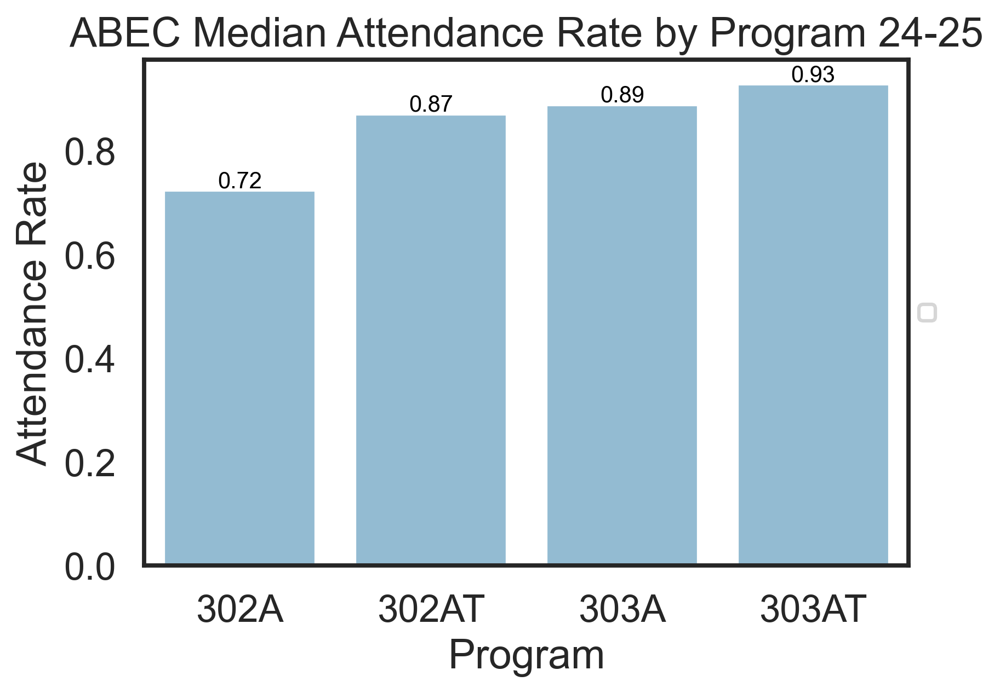

In [296]:
fig = plt.figure(figsize=(6,4))

ax = sns.barplot(x='Program',
            y='Attendance Rate',
              data=abec_attendance_by_program, 
                 color='#89bedc',
            errorbar=None,
                 # width=.3
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'ABEC Median Attendance Rate by Program {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/abec_attendance_by_program', bbox_inches='tight')
plt.show()

In [297]:
abec_attendance_by_race=abec_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
abec_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.889085
Asian,0.863971
Black or African American,0.843310
Hispanic,0.878653
Two or More,0.813380
White,0.896127


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2831091912.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


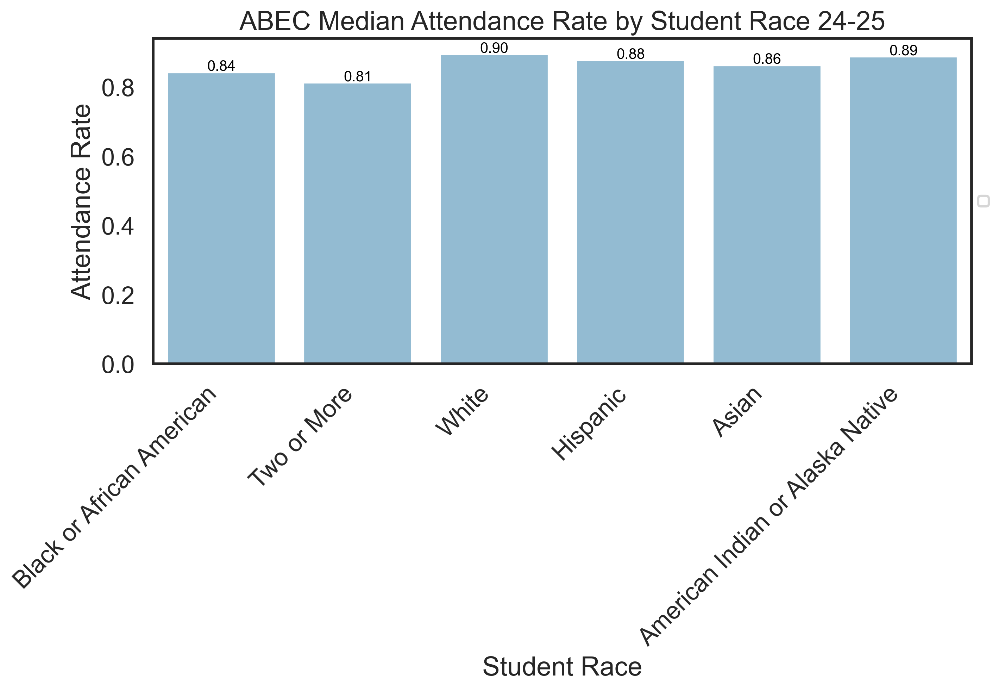

In [298]:
fig = plt.figure(figsize=(10,4))

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=abec_attendance_by_race, 
                 color='#89bedc',
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'ABEC Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/abec_attendance_by_race', bbox_inches='tight')
plt.show()

In [149]:
abec_df['Student Race'].value_counts().to_clipboard()

In [299]:
abec_chronic_by_grade=abec_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
abec_chronic_by_grade=abec_chronic_by_grade[abec_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
abec_chronic_by_grade.head()


,Grade,Chronic Absentee,Proportion
1,08,1.0,0.500000
2,09,1.0,0.789474
4,10,1.0,0.750000
6,11,1.0,0.629630
8,12,1.0,0.650000


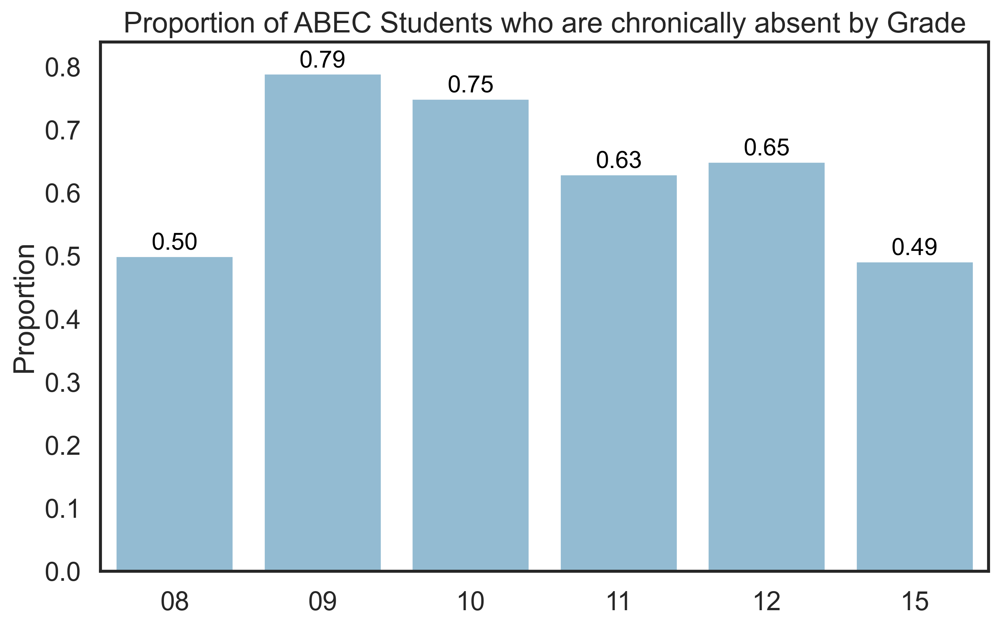

In [301]:
fig = plt.figure(figsize=(10,6))

df_to_plot=abec_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of ABEC Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/abec_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()

In [302]:
abec_chronic_by_race=abec_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
abec_chronic_by_race=abec_chronic_by_race[abec_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
abec_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,0.666667
2,Asian,1.0,0.600000
4,Black or African American,1.0,0.691176
7,Hispanic,1.0,0.500000
8,Two or More,1.0,0.600000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2449990804.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


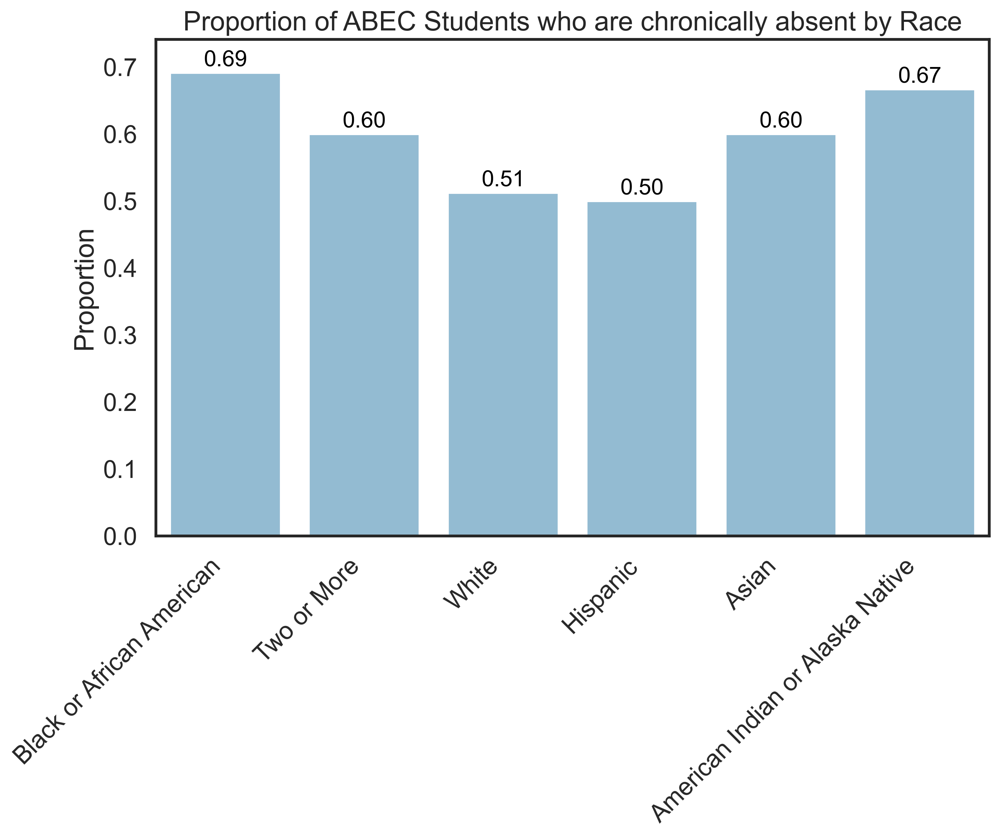

In [303]:
fig = plt.figure(figsize=(10,6))

df_to_plot=abec_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of ABEC Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/abec_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [304]:
abec_chronic_by_language=abec_df.groupby('Language Spoken In the Home')['Chronic Absentee'].value_counts(normalize=True).reset_index()
abec_chronic_by_language=abec_chronic_by_language[abec_chronic_by_language['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
abec_chronic_by_language.head()

,Language Spoken In the Home,Chronic Absentee,Proportion
0,Abon (427),1.0,1.000000
1,Arabic (002),1.0,1.000000
4,English (011),1.0,0.632479
7,Hindi (019),1.0,1.000000
9,Korean (026),1.0,1.000000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2125202941.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


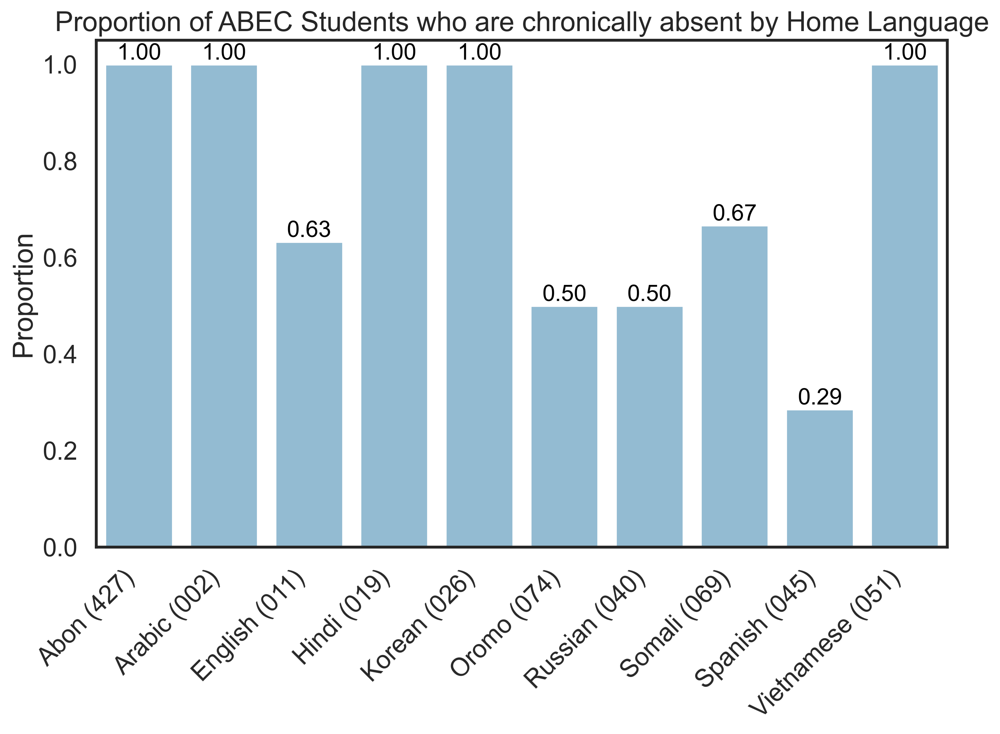

In [305]:
fig = plt.figure(figsize=(10,6))

df_to_plot=abec_chronic_by_language

ax = sns.barplot(x='Language Spoken In the Home',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of ABEC Students who are chronically absent by Home Language")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/abec_chronic_by_language', dpi=300, bbox_inches='tight')
plt.show()

In [153]:
abec_df['Language Spoken In the Home'].value_counts().to_clipboard()


## CTC

In [309]:
gateway_df=df[df['School']=='Gateway']

In [310]:
gateway_attendance_by_grade=gateway_df.groupby('Grade')['Attendance Rate'].median().to_frame()
gateway_attendance_by_grade

,Attendance Rate
Grade,
10,0.269746
11,0.364583
12,0.292623
14,0.218329


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


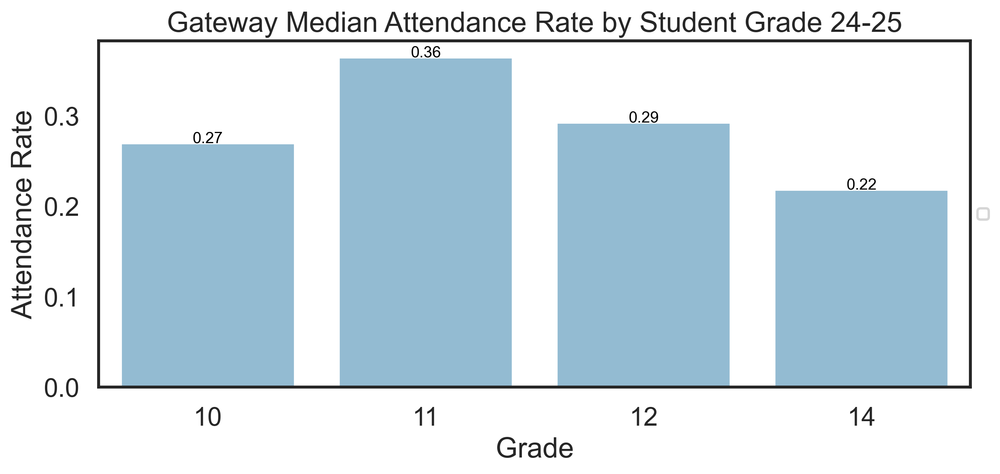

In [313]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=gateway_attendance_by_grade, 
                 color='#89bedc', 
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .0005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'Gateway Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/gateway_attendance_by_grade', bbox_inches='tight')
plt.show()

In [314]:
gateway_attendance_by_race=gateway_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
gateway_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.182551
Asian,0.174706
Black or African American,0.328638
Hispanic,0.357932
Two or More,0.342074
White,0.221053


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\3541973179.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


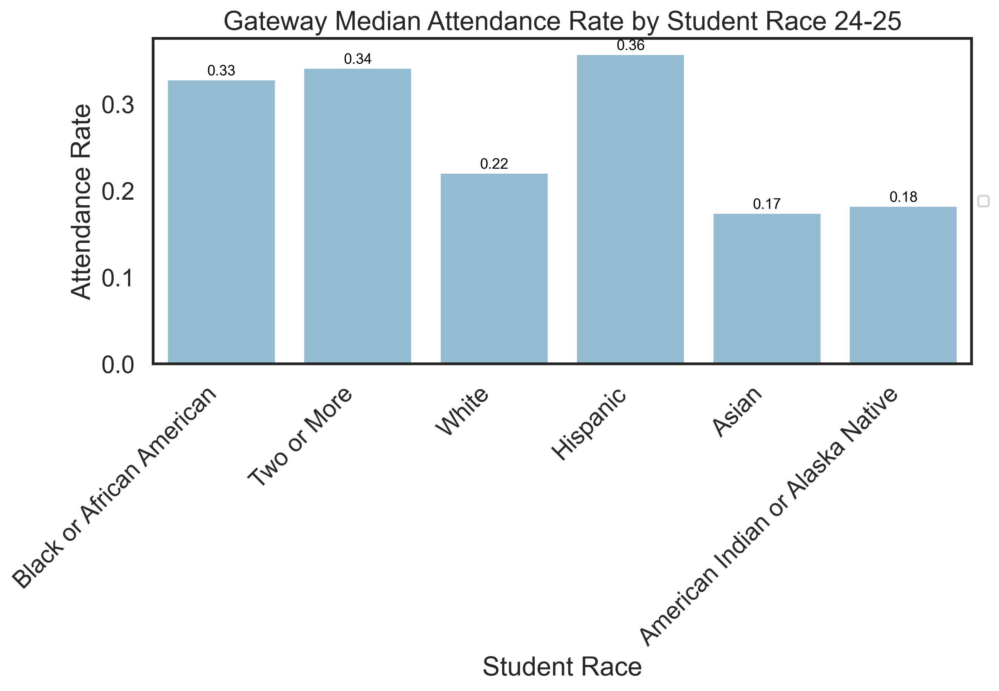

In [315]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=gateway_attendance_by_race, 
                 color='#89bedc', 
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'Gateway Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/gateway_attendance_by_race', bbox_inches='tight')
plt.show()

In [316]:
gateway_chronic_by_grade=gateway_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
gateway_chronic_by_grade=gateway_chronic_by_grade[gateway_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
gateway_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
0,10,1.0,1.000000
1,11,1.0,1.000000
2,12,1.0,0.925926
4,14,1.0,0.952381


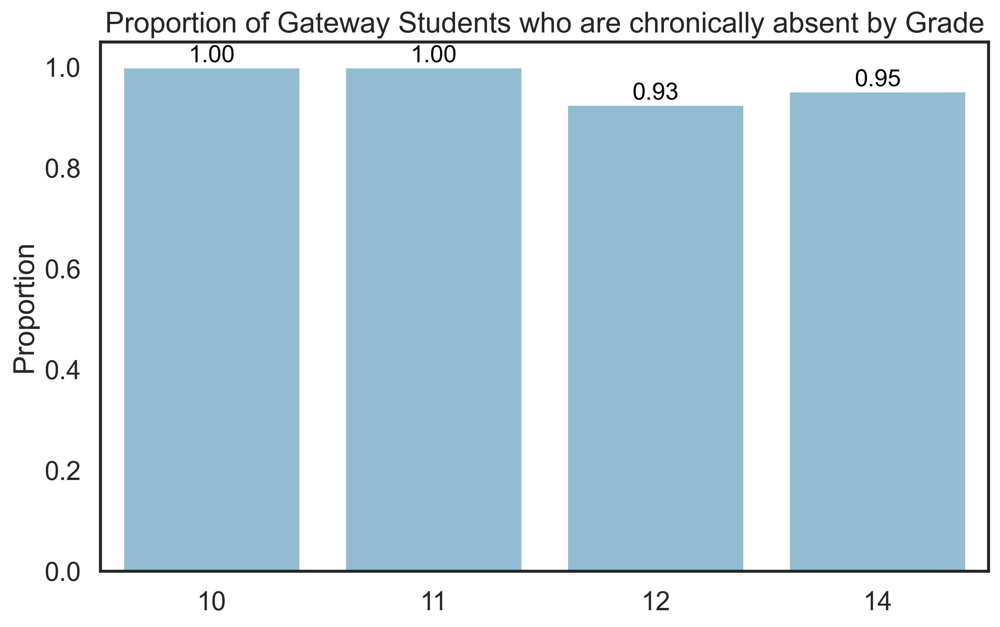

In [318]:
fig = plt.figure(figsize=(10,6))

df_to_plot=gateway_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of Gateway Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/gateway_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()


In [319]:
gateway_grade=gateway_df['Grade'].value_counts().sort_index().to_frame()
gateway_grade

,count
Grade,
10,6
11,15
12,54
14,42


In [161]:
gateway_grade.to_clipboard()

In [320]:
gateway_chronic_by_race=gateway_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
gateway_chronic_by_race=gateway_chronic_by_race[gateway_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
gateway_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,1.000000
1,Asian,1.0,0.666667
3,Black or African American,1.0,0.971429
5,Hispanic,1.0,1.000000
6,Two or More,1.0,0.933333


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\1264424057.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


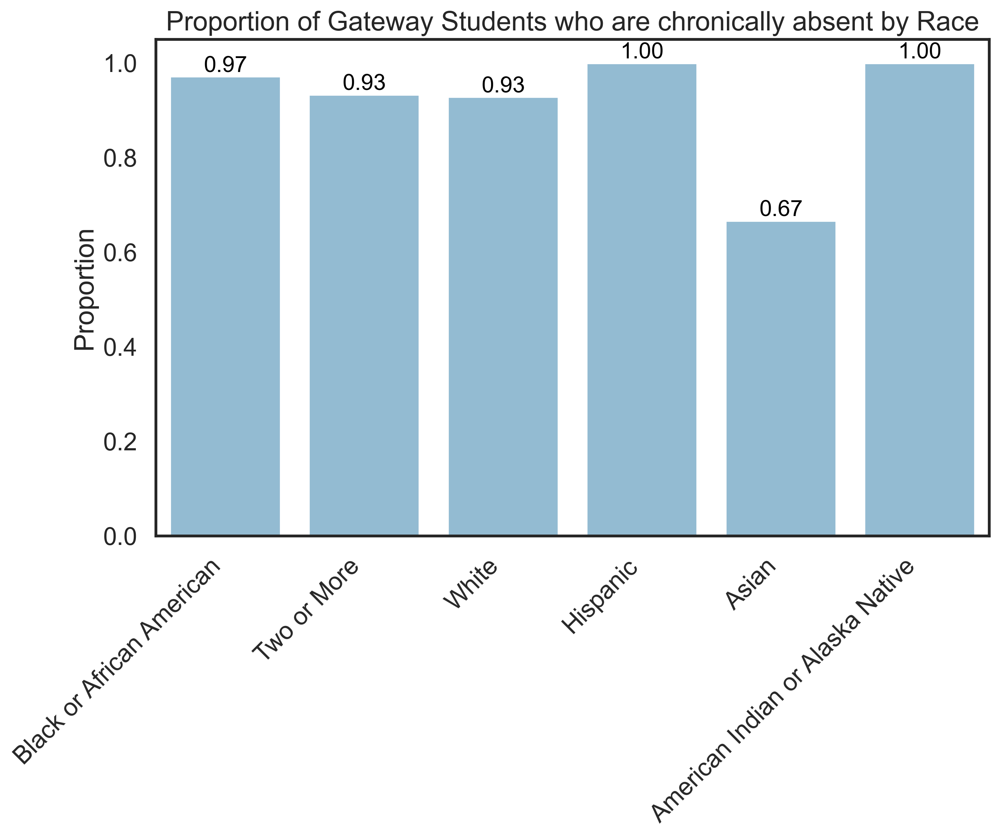

In [321]:
fig = plt.figure(figsize=(10,6))

df_to_plot=gateway_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of Gateway Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/gateway_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [163]:
gateway_race=gateway_df['Student Race'].value_counts().to_frame()
gateway_race

,count
Student Race,
White,33
Black or African American,28
Hispanic,14
Two or More,11
American Indian or Alaska Native,1
Asian,1


In [164]:
gateway_race.to_clipboard()

In [322]:
ctc_df=df[df['School']=='CTC Transition']
ctc_df.head()

,Site,Program,Student Name,District287 Id,Grade,Student Race,Attendance Rate,% Attendance not Taken (Presumed Present),School,Student Gender,Student Age,Language Spoken In the Home,Original Enter Date,District Of Residence,State Ethnicity,Years Enrolled,Student Age_Years,Chronic Absentee
1316,CTC,301CT,"Hicks, Carter W.",3680692.0,15,White,0.940315,0.045796,CTC Transition,Male,20 yrs 0 mths,English (011),2024-09-30,0278 Orono,0-0 Non North American Indian,0.18,20.0,0.0
1317,CTC,301CT,"Spizale, Cormac J.",3678472.0,15,White,0.039141,0.006313,CTC Transition,Male,19 yrs 6 mths,English (011),2024-09-03,0273 Edina,0-0 Non North American Indian,0.25,19.0,1.0
1318,CTC,301CT,"Carlson, Ciara E.",3677871.0,15,Two or More,0.830106,0.074824,CTC Transition,Female,19 yrs 8 mths,English (011),2024-09-03,0273 Edina,0-0 Non North American Indian,0.25,19.0,1.0
1319,CTC,301CT,"Riggs, Teague B.",3668583.0,15,White,0.699257,0.023515,CTC Transition,Male,19 yrs 7 mths,English (011),2022-09-01,0273 Edina,0-0 Non North American Indian,2.26,19.0,1.0
1320,CTC,301CT,"Dewey, LeBraun E.",3667819.0,15,Hispanic,0.503815,0.030810,CTC Transition,Male,19 yrs 2 mths,English (011),2022-09-01,0273 Edina,0-0 Non North American Indian,2.26,19.0,1.0


In [323]:
ctc_attendance_by_grade=ctc_df.groupby('Grade')['Attendance Rate'].median().to_frame()
ctc_attendance_by_grade

,Attendance Rate
Grade,
12,0.664394
15,0.833676


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


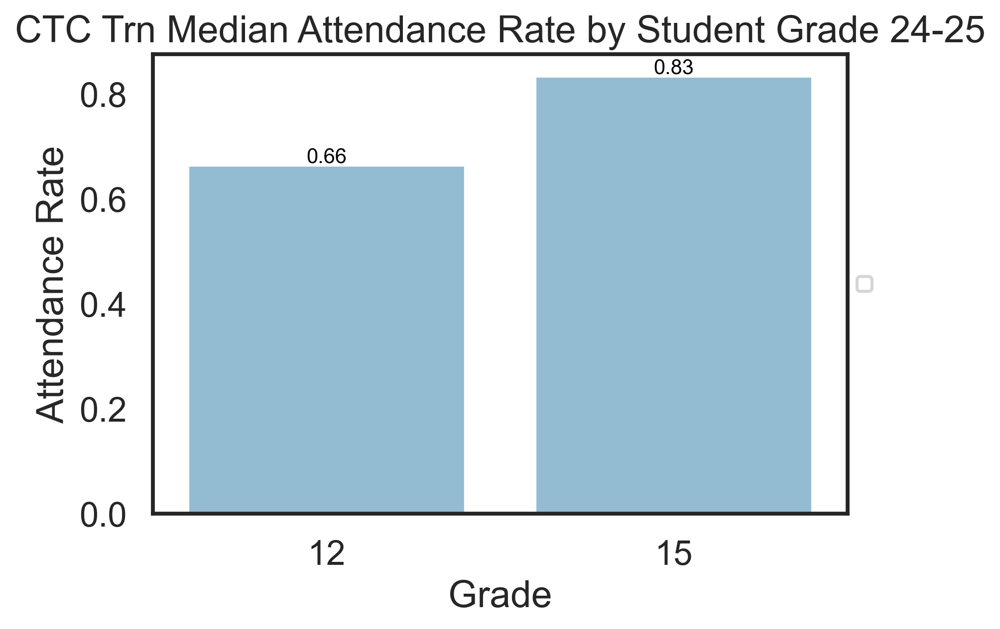

In [325]:
fig = plt.figure(figsize=(6,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=ctc_attendance_by_grade, 
                 color='#89bedc', 
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'CTC Trn Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/ctc_attendance_by_grade', bbox_inches='tight')
plt.show()

In [326]:
ctc_attendance_by_race=ctc_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
ctc_attendance_by_race

,Attendance Rate
Student Race,
Asian,0.892899
Black or African American,0.894799
Hispanic,0.746772
Two or More,0.740904
White,0.825460


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\3722064259.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


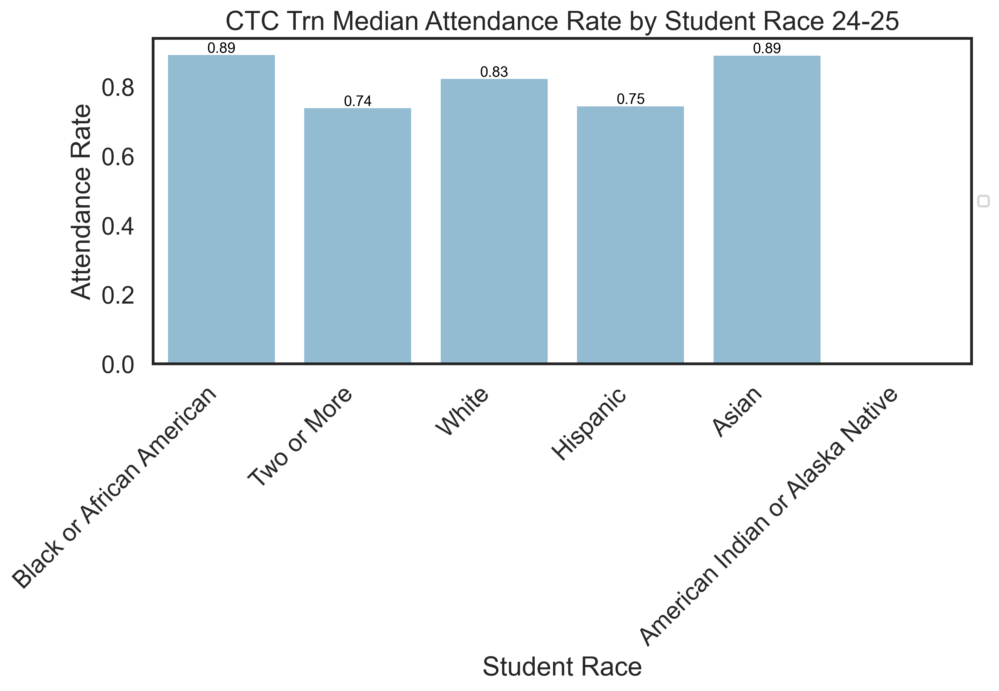

In [327]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=ctc_attendance_by_race, 
                 color='#89bedc', 
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'CTC Trn Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/ctc_attendance_by_race', bbox_inches='tight')
plt.show()

In [170]:
ctc_race=ctc_df['Student Race'].value_counts().to_frame()
ctc_race

,count
Student Race,
White,13
Two or More,5
Hispanic,3
Black or African American,3
Asian,2


In [171]:
ctc_race.to_clipboard()

In [328]:
ctc_chronic_by_grade=ctc_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
ctc_chronic_by_grade=ctc_chronic_by_grade[ctc_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
ctc_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
0,12,1.0,1.000000
1,15,1.0,0.642857


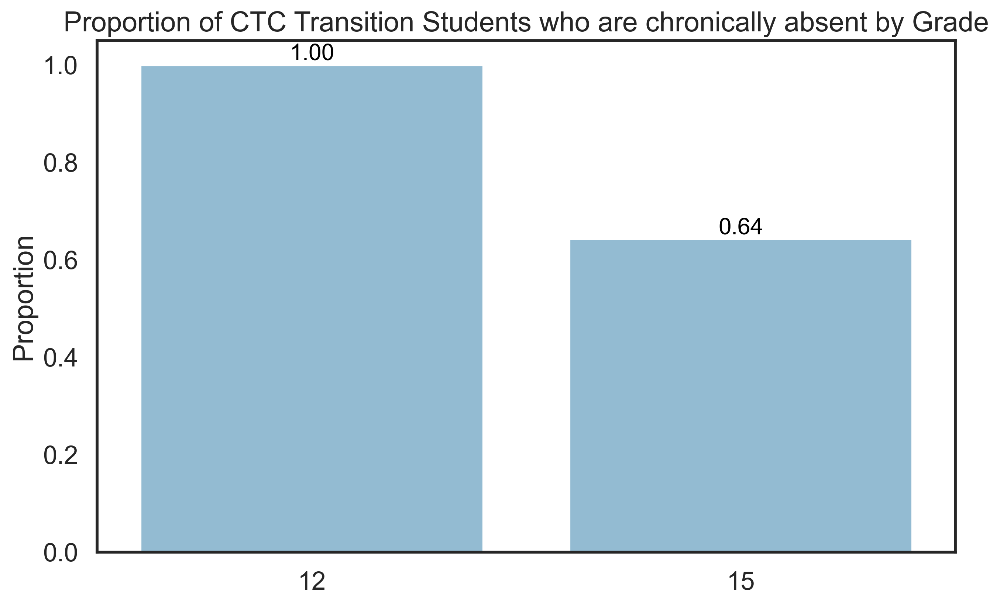

In [329]:
fig = plt.figure(figsize=(10,6))

df_to_plot=ctc_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of CTC Transition Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/ctc_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()

In [330]:
ctc_grade=ctc_df['Grade'].value_counts().sort_index().to_frame()
ctc_grade

,count
Grade,
12,1
15,28


In [174]:
ctc_grade.to_clipboard()

In [332]:
ctc_chronic_by_race=ctc_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
ctc_chronic_by_race=ctc_chronic_by_race[ctc_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
ctc_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,Asian,1.0,0.666667
2,Black or African American,1.0,0.666667
4,Hispanic,1.0,0.666667
6,Two or More,1.0,0.666667
8,White,1.0,0.642857


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2252122273.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


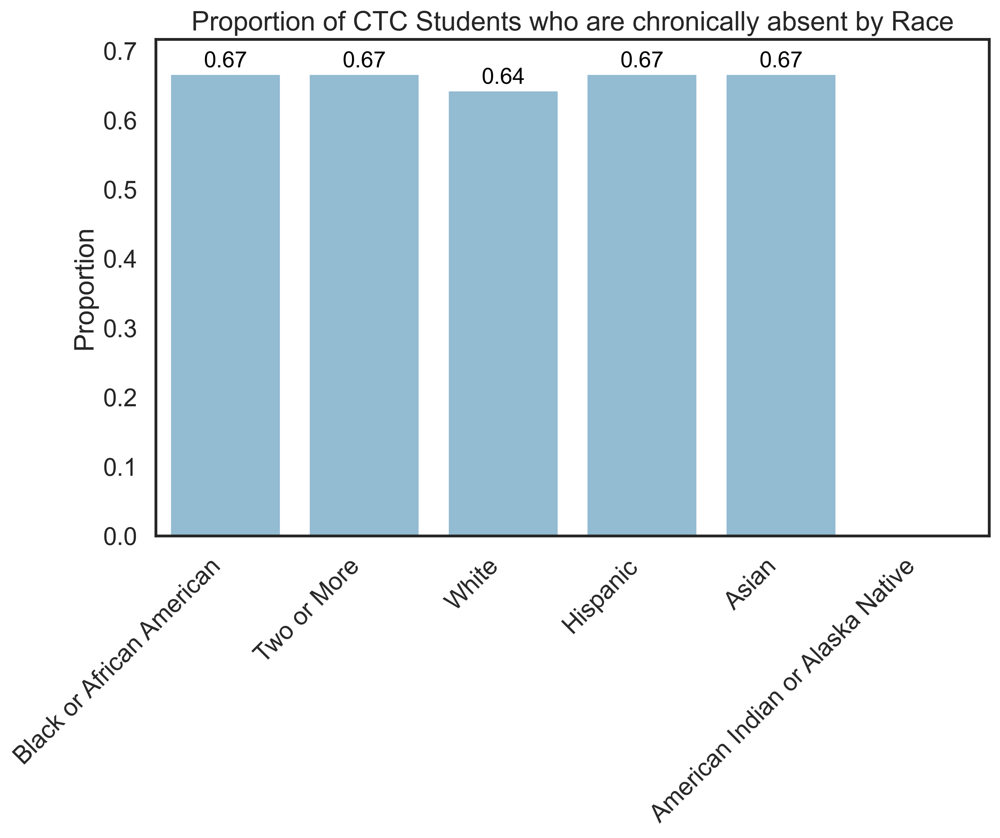

In [333]:
fig = plt.figure(figsize=(10,6))

df_to_plot=ctc_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of CTC Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/ctc_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()


In [334]:
pathways_df=df[df['School']=='Pathways']
pathways_df.head()

,Site,Program,Student Name,District287 Id,Grade,Student Race,Attendance Rate,% Attendance not Taken (Presumed Present),School,Student Gender,Student Age,Language Spoken In the Home,Original Enter Date,District Of Residence,State Ethnicity,Years Enrolled,Student Age_Years,Chronic Absentee
495,CTC,0032,"Kramer, Jack C.",3683477.0,12,White,0.931818,0.022727,Pathways,Male,18 yrs 6 mths,English (011),2025-02-12,0278 Orono,0-0 Non North American Indian,-0.19,18.0,0.0
496,CTC,0032,"Torres-Alatorre, John",3682922.0,12,Hispanic,0.600000,0.018182,Pathways,Male,17 yrs 9 mths,English (011),2025-01-22,0284 Wayzata,0-0 Non North American Indian,-0.13,17.0,1.0
497,CTC,0032,"Bastiaens, Josephine G.",3682783.0,12,White,0.654545,0.000000,Pathways,Female,18 yrs 6 mths,English (011),2024-08-01,0284 Wayzata,0-0 Non North American Indian,0.34,18.0,1.0
498,CTC,0032,"Harper, Isianique F.",3682777.0,12,Black or African American,0.654545,0.009091,Pathways,Female,17 yrs 11 mths,English (011),2024-08-01,0279 Osseo,0-0 Non North American Indian,0.34,17.0,1.0
499,CTC,0032,"Englund, Connor D.",3682774.0,10,White,0.745455,0.000000,Pathways,Male,16 yrs 7 mths,English (011),2024-08-01,0284 Wayzata,0-0 Non North American Indian,0.34,16.0,1.0


In [335]:
pathways_attendance_by_grade=pathways_df.groupby('Grade')['Attendance Rate'].median().to_frame()
pathways_attendance_by_grade

,Attendance Rate
Grade,
09,0.258503
10,0.739437
11,0.763636
12,0.795775
14,0.816901
15,0.775080


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


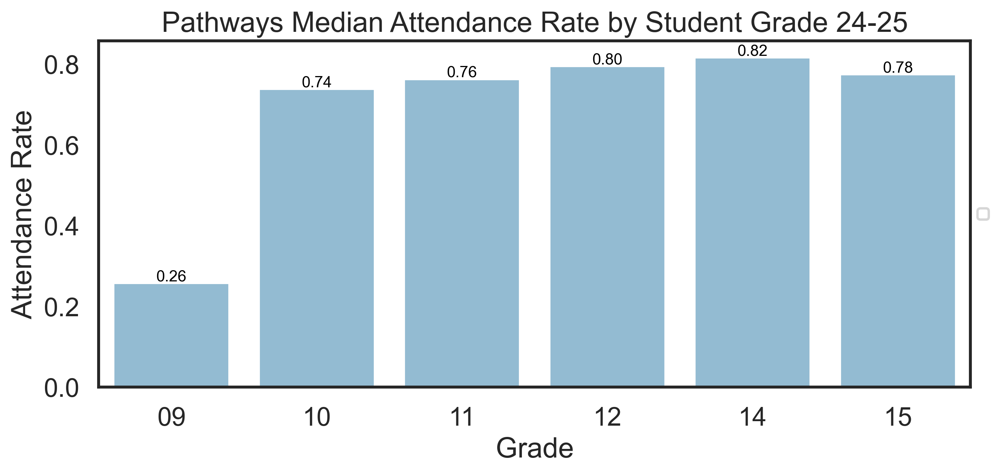

In [336]:
fig = plt.figure(figsize=(10,4))

ax = sns.barplot(x='Grade',
            y='Attendance Rate',
              data=pathways_attendance_by_grade, 
                 color='#89bedc',
            errorbar=None
            )
for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'Pathways Median Attendance Rate by Student Grade {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/pathways_attendance_by_grade', bbox_inches='tight')
plt.show()

In [337]:
pathways_attendance_by_race=pathways_df.groupby('Student Race')['Attendance Rate'].median().to_frame()
pathways_attendance_by_race

,Attendance Rate
Student Race,
American Indian or Alaska Native,0.469156
Asian,0.852113
Black or African American,0.734694
Hispanic,0.766876
Native Hawaiian or Other Pacific Islander,0.901206
Two or More,0.793103
White,0.802817


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\4031395365.py:12: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


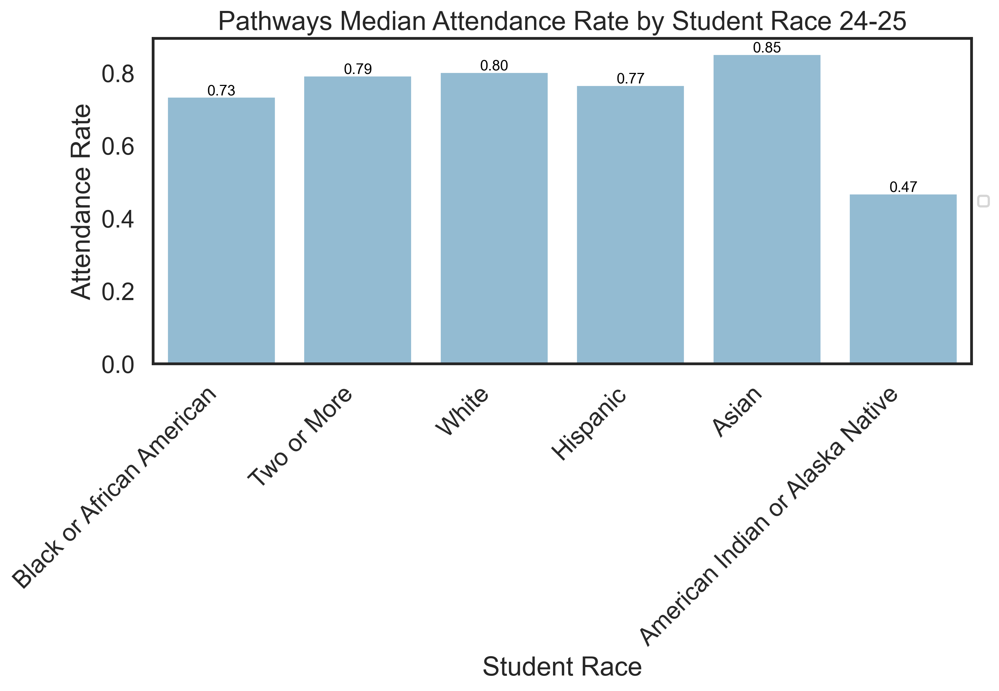

In [338]:
fig = plt.figure(figsize=(10,4))
race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(y='Attendance Rate',
            x='Student Race',
              data=pathways_attendance_by_race, 
                 color='#89bedc',
            errorbar=None, 
            order=race_order
            )

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .005, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=10, color='black')

plt.title(f'Pathways Median Attendance Rate by Student Race {school_year}')
ax.legend(loc='center left', fontsize=9, bbox_to_anchor=(1, 0.5))

plt.savefig('Outputs/pathways_attendance_by_race', bbox_inches='tight')
plt.show()

In [339]:
pathways_chronic_by_grade=pathways_df.groupby('Grade')['Chronic Absentee'].value_counts(normalize=True).reset_index()
pathways_chronic_by_grade=pathways_chronic_by_grade[pathways_chronic_by_grade['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
pathways_chronic_by_grade.head()

,Grade,Chronic Absentee,Proportion
0,09,1.0,1.000000
1,10,1.0,0.777778
3,11,1.0,0.949367
5,12,1.0,0.890625
7,14,1.0,0.888889


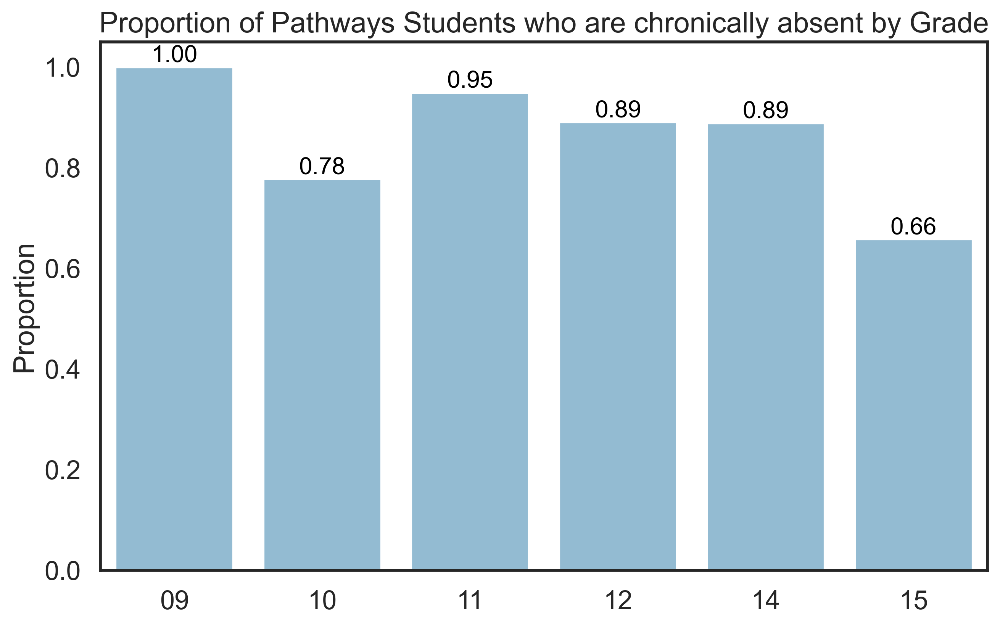

In [340]:
fig = plt.figure(figsize=(10,6))

df_to_plot=pathways_chronic_by_grade

ax = sns.barplot(x='Grade',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of Pathways Students who are chronically absent by Grade")
plt.ylabel('Proportion')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/pathways_chronic_by_grade', dpi=300, bbox_inches='tight')
plt.show()

In [182]:
pathways_grade=pathways_df['Grade'].value_counts().sort_index().to_frame()
pathways_grade.to_clipboard()

In [341]:
pathways_chronic_by_race=pathways_df.groupby('Student Race')['Chronic Absentee'].value_counts(normalize=True).reset_index()
pathways_chronic_by_race=pathways_chronic_by_race[pathways_chronic_by_race['Chronic Absentee']==1].rename(columns={'proportion':'Proportion'})
pathways_chronic_by_race.head()

,Student Race,Chronic Absentee,Proportion
0,American Indian or Alaska Native,1.0,1.000000
1,Asian,1.0,0.777778
3,Black or African American,1.0,0.926316
5,Hispanic,1.0,0.888889
8,Native Hawaiian or Other Pacific Islander,1.0,0.500000


C:\Users\mcyang\AppData\Local\Temp\ipykernel_7044\2679789101.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


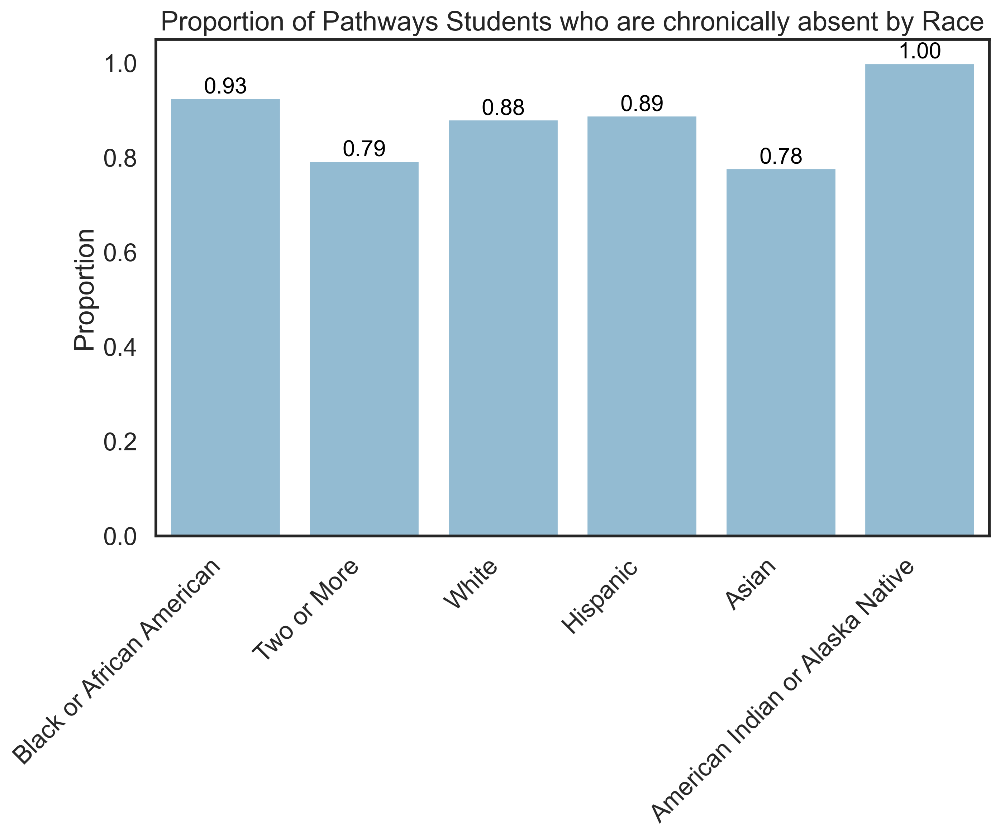

In [342]:
fig = plt.figure(figsize=(10,6))

df_to_plot=pathways_chronic_by_race

race_order=['Black or African American', 'Two or More', 'White', 'Hispanic', 'Asian', 'American Indian or Alaska Native']

ax = sns.barplot(x='Student Race',
              y='Proportion',
                 data=df_to_plot,
              color='#89bedc', 
              legend=False,
                 order=race_order
            )

for p in ax.patches:
    height = p.get_height()
    plt.text(p.get_x() + p.get_width() / 2., height + .01, f'{height:.2f}', 
             ha='center', va='baseline', fontsize=15, color='black')
    
plt.title(f"Proportion of Pathways Students who are chronically absent by Race")
plt.ylabel('Proportion')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.ylim(0, df_to_plot['Proportion'].max()+.05)
plt.gca().set(xlabel=None)

plt.savefig('Outputs/pathways_chronic_by_race', dpi=300, bbox_inches='tight')
plt.show()

In [184]:
pathways_race=pathways_df['Student Race'].value_counts().to_frame()
pathways_race.to_clipboard()